In [1]:
import os
os.environ["CC"] = "gcc"
os.environ["CXX"] = "gcc"
import sys
sys.path.append('/usr/lib/python3/dist-packages')
print(sys.path)
import os
os.environ["OMP_PROC_BIND"] = os.environ.get("OMP_PROC_BIND", "true")

import numpy as np
import matplotlib.pyplot as plt
import scipy.interpolate
%matplotlib inline

from pix_transform.pix_transform import PixTransform
from baselines.baselines import bicubic
from utils.utils import downsample,align_images
from prox_tv import tvgen
from utils.plots import plot_result

import imageio
import torch
torch.cuda.empty_cache()

['/home/beast2020/Desktop/mingchi/PixTransform-save_params', '/home/beast2020/anaconda3/lib/python38.zip', '/home/beast2020/anaconda3/lib/python3.8', '/home/beast2020/anaconda3/lib/python3.8/lib-dynload', '', '/home/beast2020/.local/lib/python3.8/site-packages', '/home/beast2020/anaconda3/lib/python3.8/site-packages', '/home/beast2020/.local/lib/python3.8/site-packages/IPython/extensions', '/home/beast2020/.ipython', '/usr/lib/python3/dist-packages']


## EPFL nadir

In [3]:
current_dir = os.getcwd()
direct = os.path.abspath(os.path.join(current_dir, os.pardir))
directory = direct +'/Data_preprocessing'

'/home/beast2020/Desktop/mingchi'

In [4]:
rgb_dir = directory+'/EPFL_nadir/rgb/'
_files = os.listdir(rgb_dir)
_files.sort()
_rgb_files = [rgb_dir + f for f in _files]
_rgb_files.sort()
print(len(_rgb_files))

dist_dir = directory+'/EPFL_nadir/dist/'
_files = os.listdir(dist_dir)
_files.sort()
_dist_files = [dist_dir + f for f in _files]
_dist_files.sort()
print(len(_dist_files))

25
25


In [5]:
guide_imgs = []
target_imgs= []

for num in range(len(_rgb_files)):
    rgb_img = imageio.imread(_rgb_files[num])
    guide_imgs.append(rgb_img)
    dist_img = torch.load(_dist_files[num])
    dist_img = dist_img.detach().cpu().numpy()
    target_imgs.append(dist_img)
        
guide_imgs = np.asarray(guide_imgs)
guide_imgs = np.einsum('ijkl->iljk', guide_imgs)        
target_imgs = np.asarray(target_imgs)

In [6]:
print(guide_imgs.shape)
print('max value in the image is: ' + str(guide_imgs.max()))
print('min value in the image is: ' + str(guide_imgs.min()))

(25, 3, 480, 720)
max value in the image is: 255
min value in the image is: 0


In [7]:
print(target_imgs.shape)
print('max value in the image is: ' + str(target_imgs.max()))
print('min value in the image is: ' + str(target_imgs.min()))

(25, 480, 720)
max value in the image is: 97.91275
min value in the image is: 44.26991


### Change upsampling to 40

In [14]:
torch.cuda.empty_cache()

####### image 1/25 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[63.80728  17.969288 17.985546 16.63551  14.323522 14.158148 12.260081
 11.851934 10.812558 10.604242 10.14191   9.886817 10.684521  9.691417
  9.299359  9.265695]
----------MAE----------
(16,)
[6.1076584 3.0245345 2.8942103 2.70612   2.5131953 2.5728643 2.2384088
 2.2143848 2.116292  2.0897095 2.0068414 2.0113506 2.0590327 1.9779322
 1.9547526 1.953459 ]


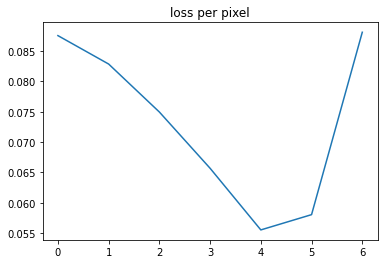

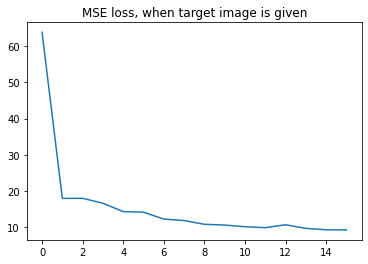

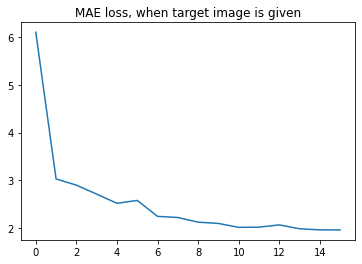

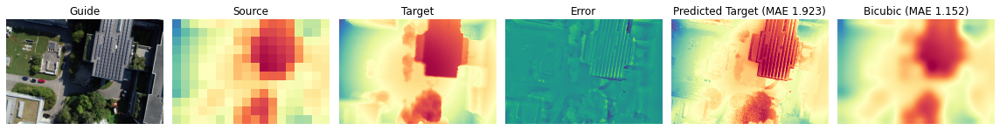

MSE: 9.114  ---  MAE: 1.923  ---  PBP: 0.549



####### image 2/25 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[67.359825 15.638137 14.077031 13.930617 12.114042 11.767575 10.801655
 10.449469  9.893718  9.780741  8.674553  8.665585  8.709901  8.18412
  8.102079  8.165848]
----------MAE----------
(16,)
[6.401311  2.9230578 2.7017958 2.6109586 2.4221764 2.318859  2.1515355
 2.1076937 2.044426  2.09499   1.8977453 1.8749657 1.8969672 1.8245656
 1.8276308 1.8770783]


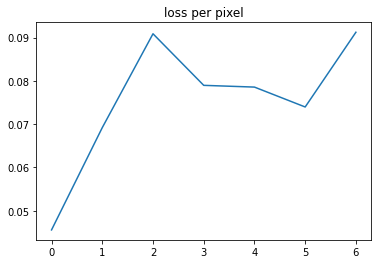

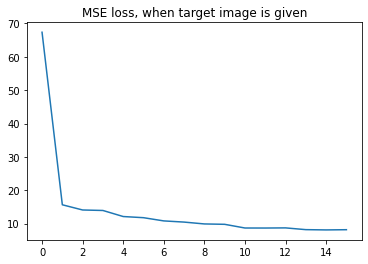

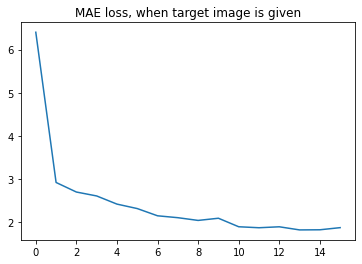

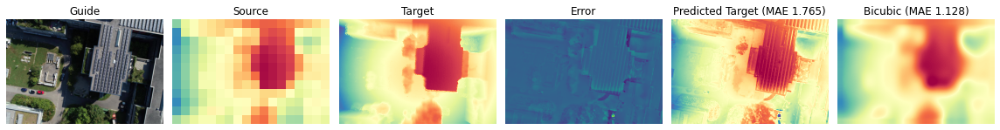

MSE: 7.696  ---  MAE: 1.765  ---  PBP: 0.524



####### image 3/25 - image idx 2 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[66.177185 13.147066 12.159508 10.895673 11.276065 11.048857 11.244551
 11.958751 10.557709 10.504233 10.390765 10.406363 10.784925 10.117655
 10.389174 10.694757]
----------MAE----------
(16,)
[6.5301127 2.5620315 2.4253786 2.2660334 2.3498201 2.2563527 2.328725
 2.3739183 2.1422703 2.101274  2.114605  2.1553235 2.1404655 2.0561602
 2.10076   2.1039288]


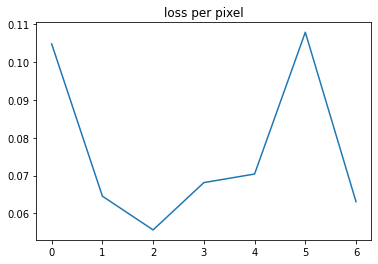

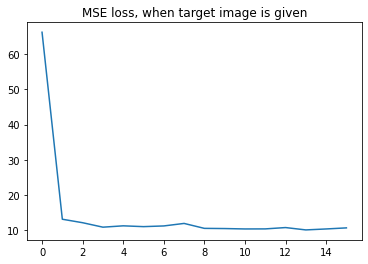

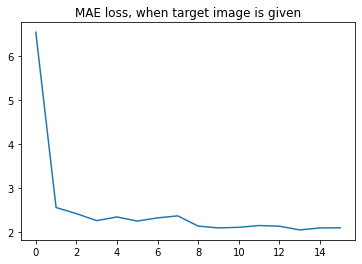

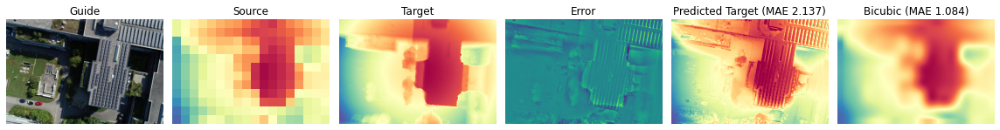

MSE: 10.770  ---  MAE: 2.137  ---  PBP: 0.583



####### image 4/25 - image idx 3 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[87.3302   14.732992 14.182895 13.28557  12.616882 12.754556 12.595627
 11.904384 10.98511  11.869618 11.664666 11.769988 11.110504 10.916625
 11.305087 10.483941]
----------MAE----------
(16,)
[7.8732677 2.6752713 2.5537806 2.4473484 2.3795536 2.3562007 2.3194814
 2.273019  2.2076006 2.2983348 2.287506  2.250243  2.1824787 2.1741478
 2.2113044 2.1161673]


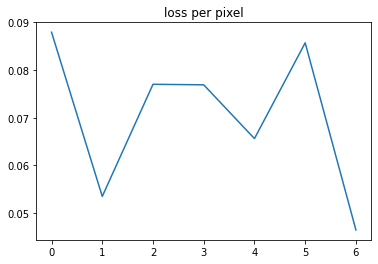

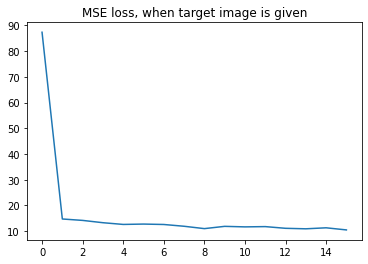

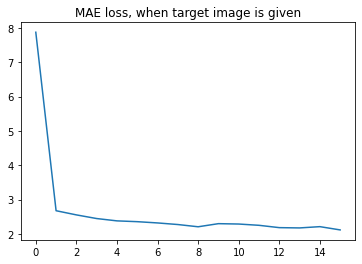

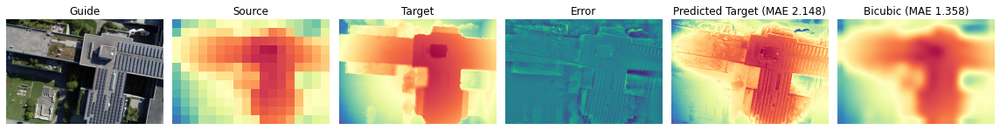

MSE: 10.751  ---  MAE: 2.148  ---  PBP: 0.582



####### image 5/25 - image idx 4 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[83.296585  16.666044  14.032616  13.8603525 11.782115  12.76832
 10.569622   9.998313   9.808446   9.532283   8.840335   8.811484
  9.005372   8.196211   8.409025   8.122622 ]
----------MAE----------
(16,)
[7.557771  2.8356278 2.5410025 2.5199876 2.275315  2.4426079 2.2829444
 2.0625474 2.0803847 2.0428526 1.9519882 1.9764891 2.0209484 1.9315368
 1.9415191 1.8753246]


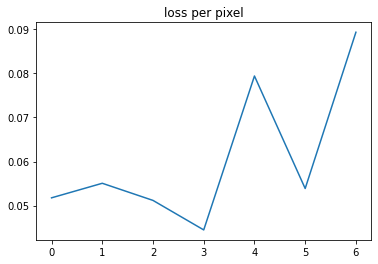

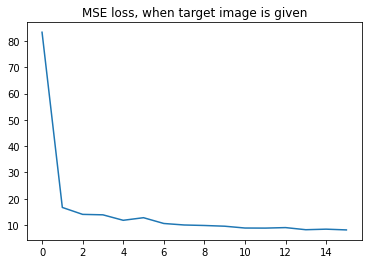

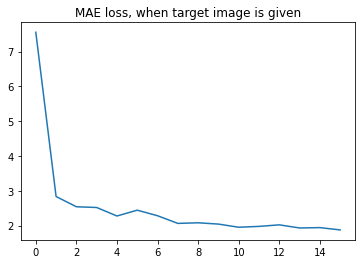

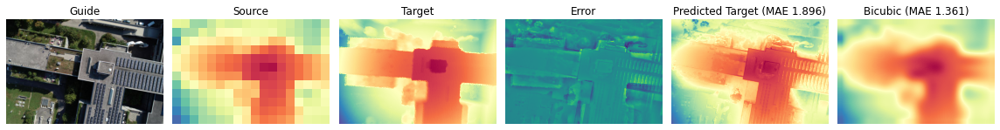

MSE: 8.130  ---  MAE: 1.896  ---  PBP: 0.536



####### image 6/25 - image idx 5 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[83.34711  15.916886 16.147566 15.069278 15.601674 13.625028 13.030173
 13.047627 12.196719 11.051693 10.793741 10.368135 10.578855  9.292317
  9.153766  8.821316]
----------MAE----------
(16,)
[7.3426647 2.7591648 2.7127547 2.6366978 2.7942917 2.4531395 2.431357
 2.428865  2.3521972 2.203583  2.2143207 2.144422  2.2507997 2.0197005
 2.0238662 1.9915142]


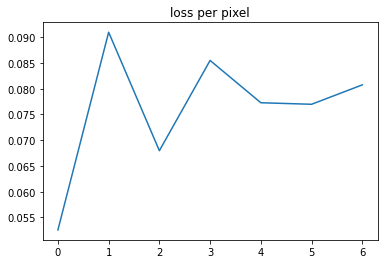

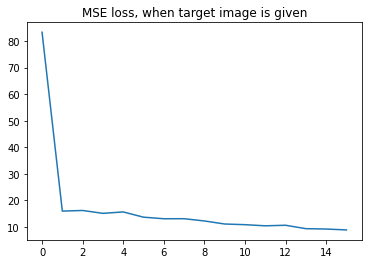

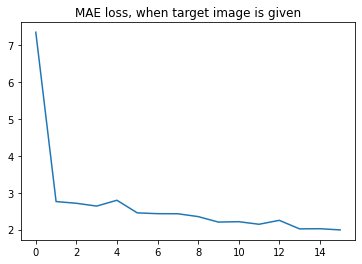

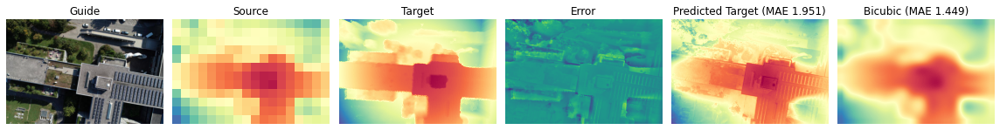

MSE: 8.509  ---  MAE: 1.951  ---  PBP: 0.549



####### image 7/25 - image idx 6 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[68.8765   20.085567 18.152668 18.070084 16.538937 15.290881 14.568563
 13.699392 14.038533 14.186694 12.646667 12.919007 12.302858 12.832431
 12.970577 13.107974]
----------MAE----------
(16,)
[6.7415323 3.124783  2.922377  2.8679323 2.7227242 2.562156  2.5515347
 2.4911878 2.5396264 2.5745418 2.3748536 2.4536736 2.3481786 2.4050837
 2.41838   2.429949 ]


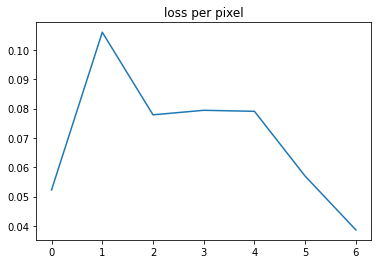

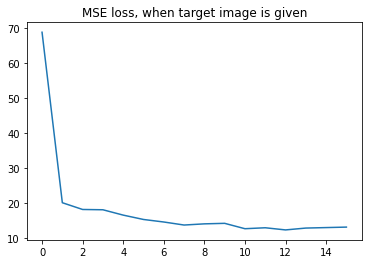

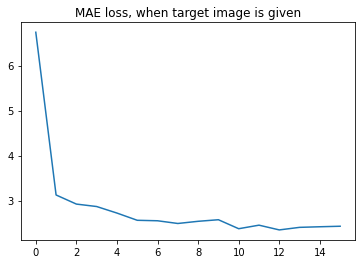

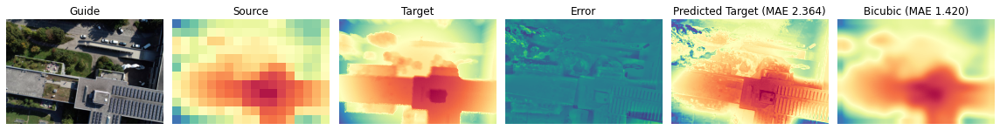

MSE: 13.182  ---  MAE: 2.364  ---  PBP: 0.599



####### image 8/25 - image idx 7 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[41.410816 17.204212 18.783295 20.82364  22.07098  21.551672 22.773947
 22.246838 24.654097 21.560333 22.456959 22.214132 21.547453 22.355906
 20.74798  20.29992 ]
----------MAE----------
(16,)
[5.1902223 3.063627  3.0596578 3.1906    3.2378569 3.1513615 3.212976
 3.21346   3.3510034 3.1804347 3.213235  3.1659324 3.1402261 3.1797132
 3.104145  3.0500221]


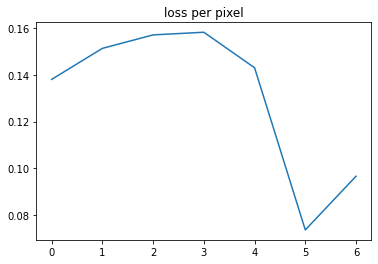

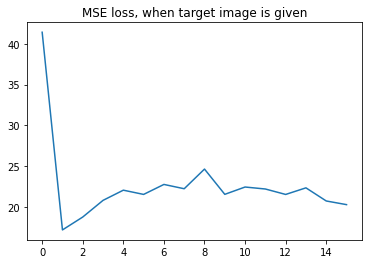

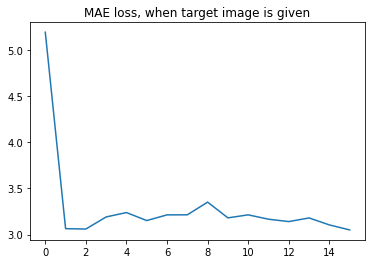

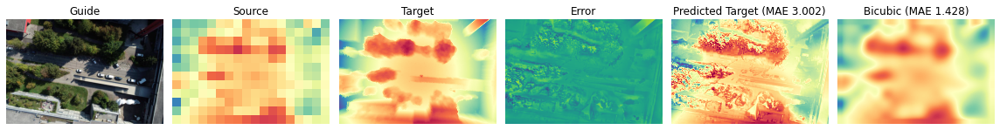

MSE: 19.594  ---  MAE: 3.002  ---  PBP: 0.695



####### image 9/25 - image idx 8 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[68.72722   15.265149  13.313678  12.073      9.3193245  8.689469
  8.05809    7.8140936  7.5119367  7.200734   7.4433045  6.578472
  6.3806005  6.361949   6.312382   5.8158007]
----------MAE----------
(16,)
[6.705516  2.8870156 2.650782  2.4362192 2.1367815 2.0491426 1.9668843
 1.910152  1.8741367 1.8156414 1.8343247 1.7445253 1.7168041 1.7379919
 1.7047555 1.6521101]


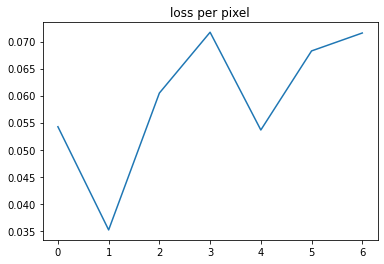

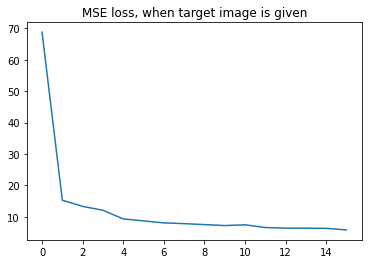

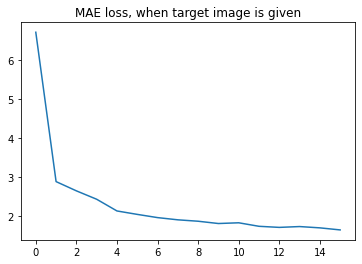

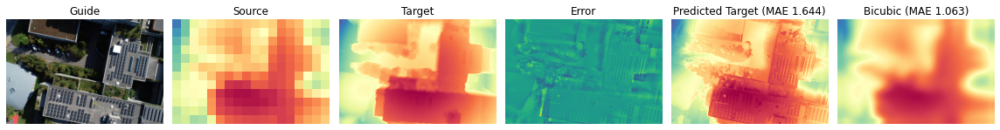

MSE: 5.772  ---  MAE: 1.644  ---  PBP: 0.524



####### image 10/25 - image idx 9 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[61.03816   16.915327  15.688328  14.221162  13.300884  11.146438
 10.342789  10.215558   9.701886   8.213497   7.985676   7.790168
  7.8327627  7.24383    7.6410155  7.011124 ]
----------MAE----------
(16,)
[6.5604444 3.0604565 2.8960876 2.7485616 2.681764  2.3891125 2.296951
 2.2871711 2.245837  2.0409904 2.0401404 1.9894083 2.0394657 1.9111574
 1.9818469 1.8806746]


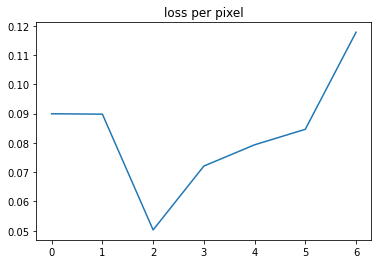

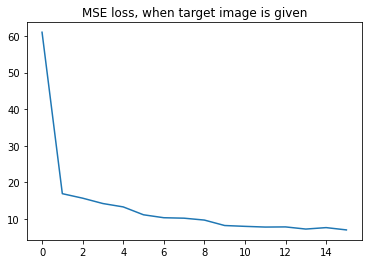

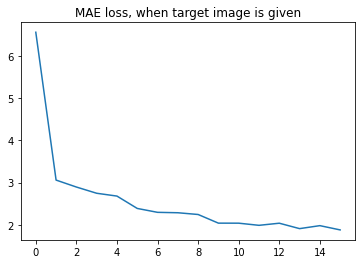

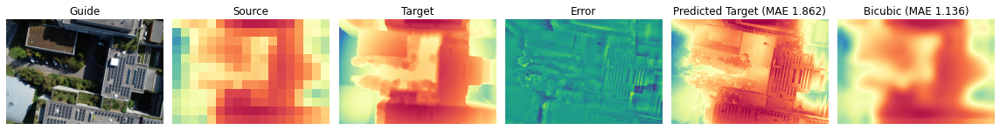

MSE: 7.252  ---  MAE: 1.862  ---  PBP: 0.578



####### image 11/25 - image idx 10 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[66.5315   16.80795  15.485578 14.490855 13.891912 12.95226  11.741885
 10.654848 10.661269  9.61922   8.950389  9.115346  9.03152   9.399923
  8.902051  8.786021]
----------MAE----------
(16,)
[6.7165437 3.0425694 2.8568778 2.7476122 2.7274323 2.5954392 2.4470408
 2.3623312 2.3447468 2.1969352 2.1199234 2.1490796 2.1402214 2.1932504
 2.0924585 2.0800524]


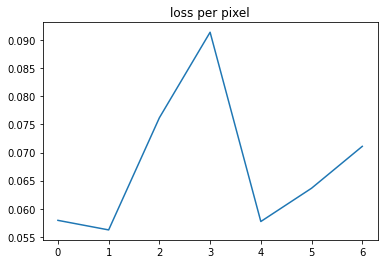

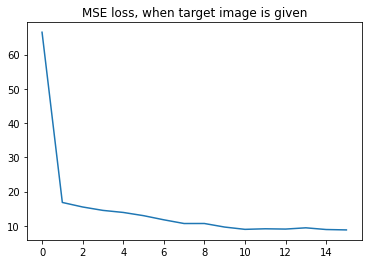

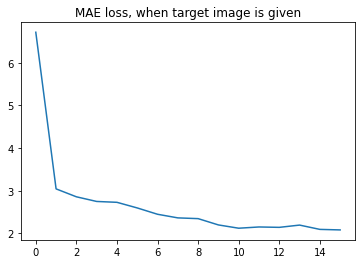

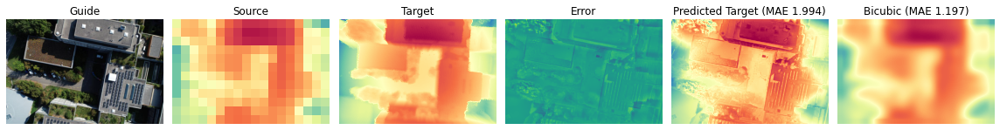

MSE: 8.171  ---  MAE: 1.994  ---  PBP: 0.599



####### image 12/25 - image idx 11 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[53.922985 18.550478 15.983429 14.906374 12.903727 11.97898  11.38699
 10.48497  10.370867  9.677321  9.135724  9.301888  9.412965  9.271361
  8.426306  8.232461]
----------MAE----------
(16,)
[5.8627815 2.9386282 2.711449  2.6618993 2.4255354 2.290166  2.2581313
 2.1373873 2.100259  2.016969  1.9534035 2.001324  1.9709984 1.961338
 1.8549953 1.7967483]


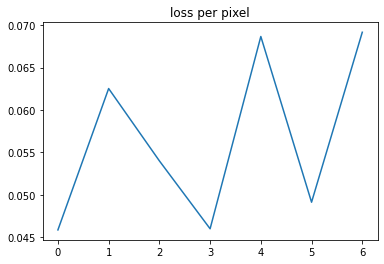

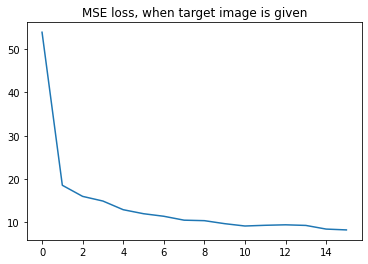

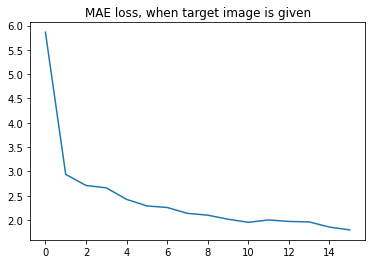

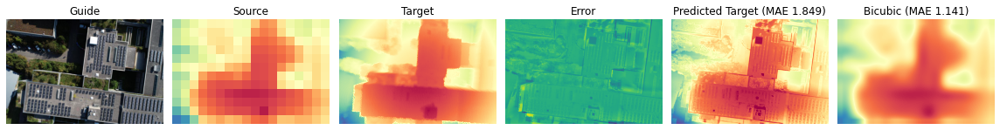

MSE: 8.598  ---  MAE: 1.849  ---  PBP: 0.519



####### image 13/25 - image idx 12 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[78.94585  16.645752 16.841057 14.07796  12.866471 12.139601 12.570978
 13.04666  13.096862 11.69984  13.013608 11.861652 11.528495 11.727079
 11.346489 11.788905]
----------MAE----------
(16,)
[6.9442086 2.776308  2.8520575 2.5087082 2.3650243 2.2908611 2.2726405
 2.319051  2.3503635 2.2246633 2.4350364 2.2299132 2.204078  2.231441
 2.1824946 2.212062 ]


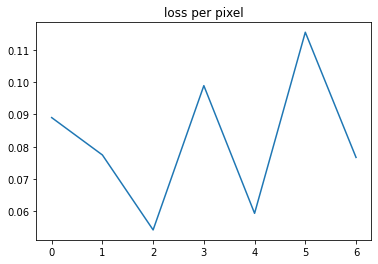

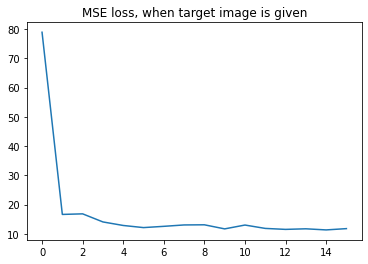

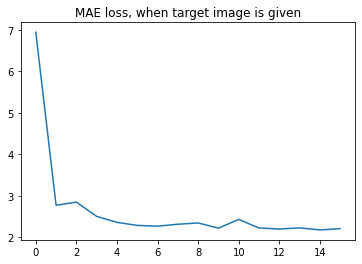

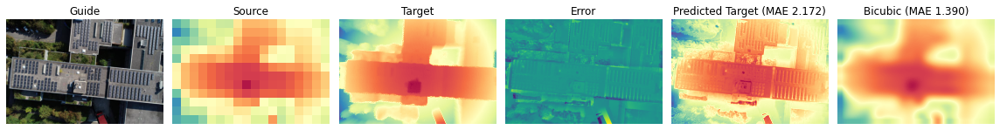

MSE: 11.331  ---  MAE: 2.172  ---  PBP: 0.594



####### image 14/25 - image idx 13 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[72.15833   22.401138  19.018858  17.010838  16.779875  16.557426
 14.820622  15.257396  14.004563  13.645964  14.373698  13.132119
 13.309609  13.612934  13.334329  13.3772135]
----------MAE----------
(16,)
[6.6254478 3.295157  2.9435155 2.7402875 2.744222  2.7352014 2.4920423
 2.4732263 2.4384418 2.3503141 2.4404488 2.2815282 2.324172  2.3284109
 2.283343  2.3457117]


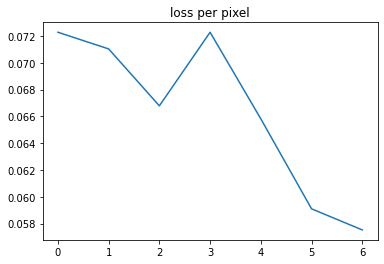

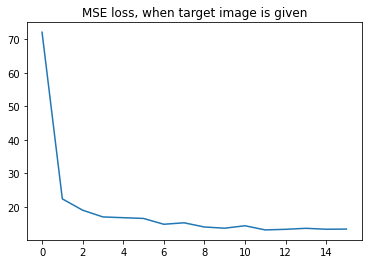

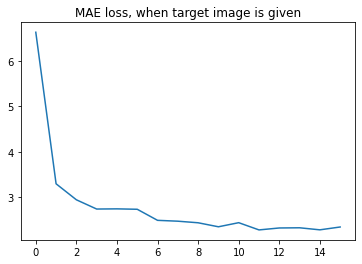

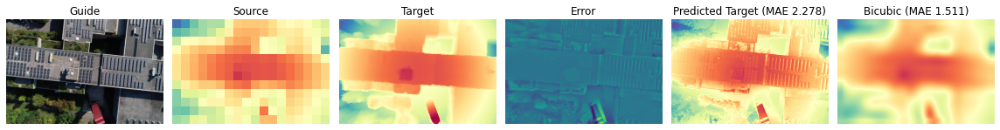

MSE: 13.138  ---  MAE: 2.278  ---  PBP: 0.581



####### image 15/25 - image idx 14 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[57.73589  14.851233 13.114778 11.474343 10.368007 10.64478  10.437082
 10.850163 10.448938 10.510074 10.342748 10.260179 10.771896 10.554863
 10.756532 10.889971]
----------MAE----------
(16,)
[5.718108  2.5175567 2.4548597 2.2457082 2.0439734 2.0438573 1.9424891
 1.9989388 1.9260782 1.9126848 1.8859487 1.8724595 1.8922548 1.8749058
 1.8769695 1.9407977]


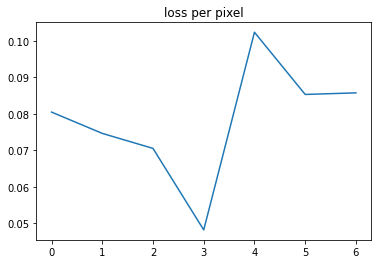

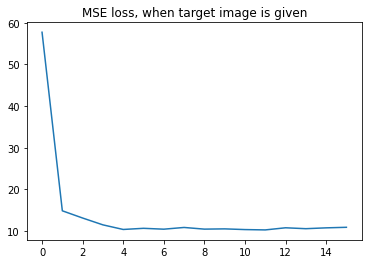

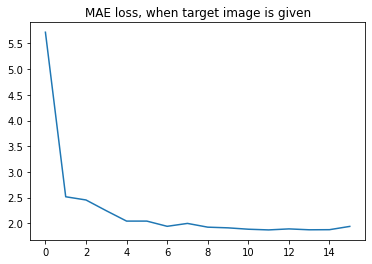

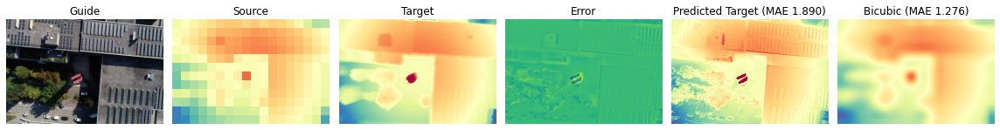

MSE: 10.816  ---  MAE: 1.890  ---  PBP: 0.475



####### image 16/25 - image idx 15 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[58.816956  15.178064  13.053044  12.049091  11.783864  10.470097
 10.682191  11.8413725 10.319754  10.491204  10.284296  10.630446
 10.479769  10.353471  10.398882  10.483974 ]
----------MAE----------
(16,)
[5.885362  2.6494706 2.3846476 2.3114507 2.280877  2.0339334 2.047736
 2.1566336 1.9277577 1.9444256 1.8994983 1.8971986 1.868714  1.852035
 1.8689532 1.8889941]


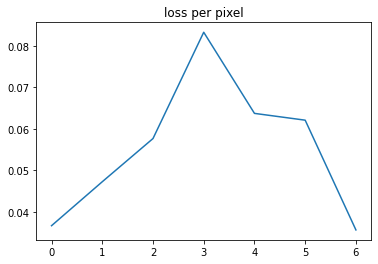

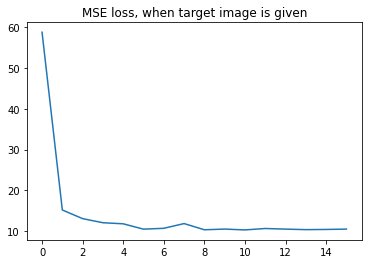

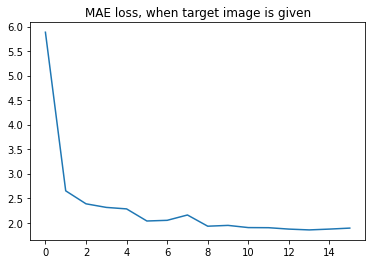

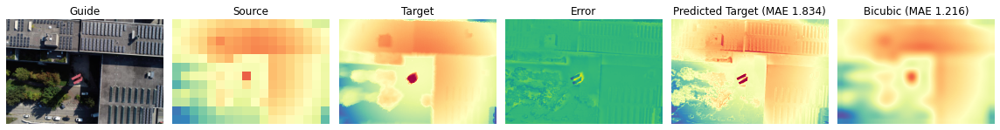

MSE: 10.276  ---  MAE: 1.834  ---  PBP: 0.473



####### image 17/25 - image idx 16 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[44.016953  11.854065   9.827814   9.542506   8.932103   9.086838
  8.713647   8.628749   8.215051   8.116102   8.100374   8.559218
  7.9642916  8.040488   7.9021854  7.5928297]
----------MAE----------
(16,)
[5.028091  2.2462072 1.9723527 1.9581518 1.8831983 1.8865489 1.8260435
 1.817969  1.7054785 1.7086849 1.695892  1.7512037 1.6379476 1.6399049
 1.6513668 1.6039045]


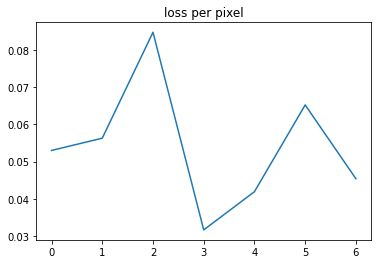

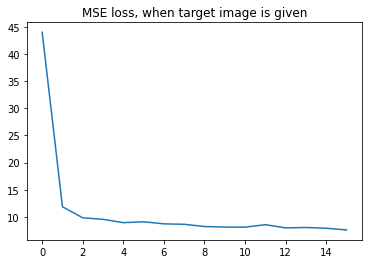

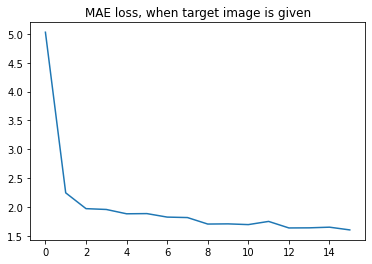

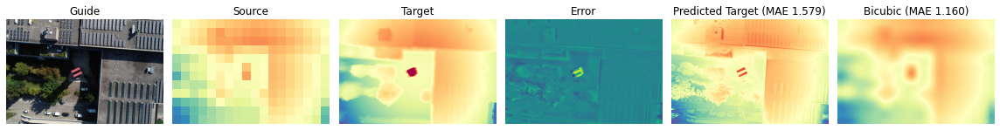

MSE: 7.519  ---  MAE: 1.579  ---  PBP: 0.446



####### image 18/25 - image idx 17 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[50.86826  11.797504 10.375189  9.365866  8.411868  8.662397  8.648502
  8.851877  9.223102  9.200904  9.893847  9.539996  9.484452  9.697506
  9.406673  9.568671]
----------MAE----------
(16,)
[5.5379734 2.3196404 2.1931279 2.0210025 1.8830242 1.8565586 1.8522441
 1.8202925 1.8757885 1.8521186 1.917234  1.8279817 1.7871888 1.7955358
 1.770654  1.8394166]


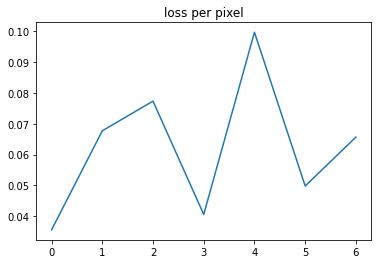

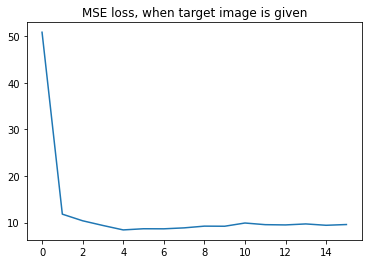

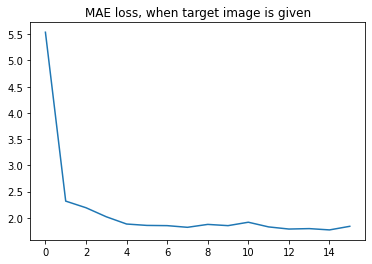

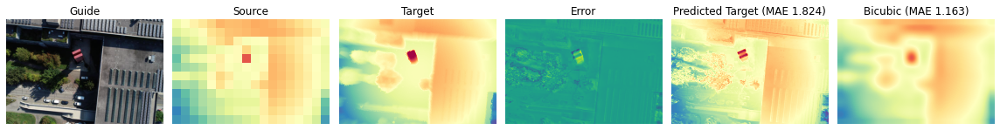

MSE: 9.604  ---  MAE: 1.824  ---  PBP: 0.489



####### image 19/25 - image idx 18 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[47.844105  12.859988  11.947312  10.765371   9.826198   9.383501
  9.234397   9.554042   8.692808   8.785794   8.6087055  8.883258
  8.712429   8.806438   9.6261635  9.569796 ]
----------MAE----------
(16,)
[5.3986254 2.389138  2.3801386 2.2201402 2.133316  2.06301   2.0148284
 2.0832999 1.9777474 1.9444112 1.86349   1.8790518 1.8583317 1.8329235
 1.8942235 1.9183335]


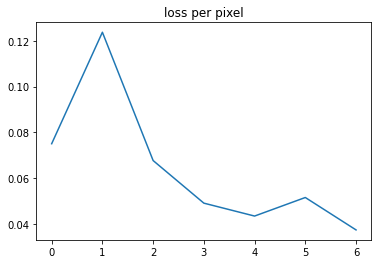

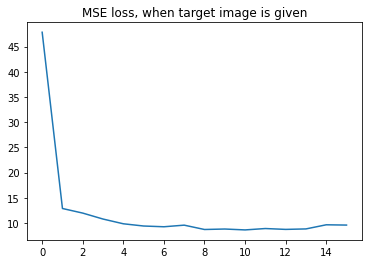

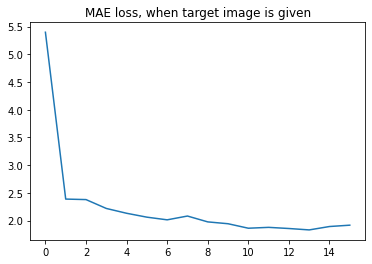

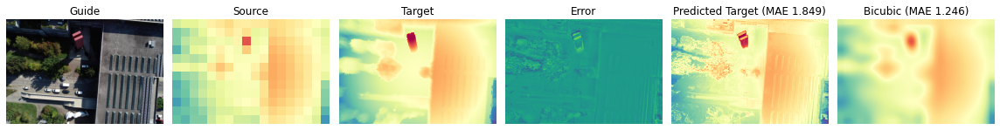

MSE: 9.511  ---  MAE: 1.849  ---  PBP: 0.477



####### image 20/25 - image idx 19 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[51.42455   15.002509  14.665541  13.733507  12.737315  12.029336
 10.9819975  9.902013  10.199939   9.688469   9.14383    8.674499
  8.965543   9.094863   8.758671   8.739468 ]
----------MAE----------
(16,)
[5.6531014 2.6980515 2.6266623 2.6595268 2.5117013 2.4258108 2.295206
 2.1912122 2.2084842 2.1478357 2.0489333 1.9809101 2.0075023 2.0283089
 1.9484245 1.9587902]


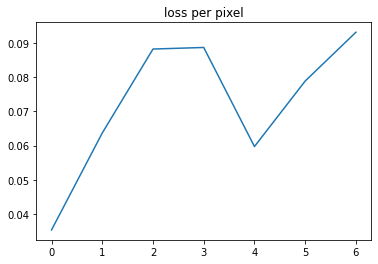

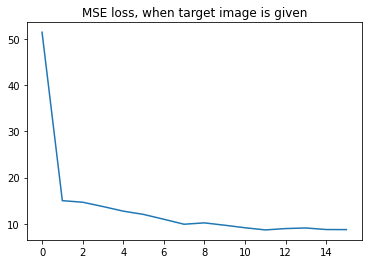

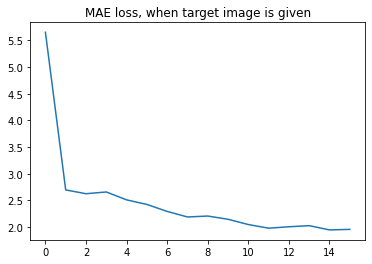

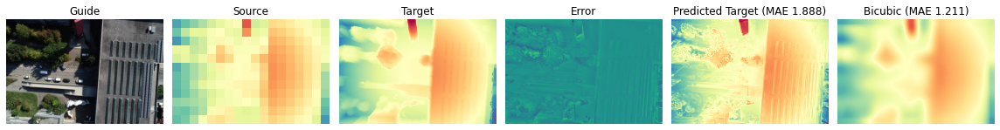

MSE: 8.491  ---  MAE: 1.888  ---  PBP: 0.526



####### image 21/25 - image idx 20 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[48.933228  13.861199  13.346117  11.674151  10.811696   9.783157
  9.799237   9.146696   9.092591   8.5732765  8.765317   8.9187975
  8.031687   7.8937883  7.9516854  7.755412 ]
----------MAE----------
(16,)
[5.6871586 2.7197564 2.581085  2.4119053 2.3323677 2.154408  2.155577
 2.064056  2.0543592 2.02355   2.036688  2.0892315 1.9333496 1.8909457
 1.9182363 1.8897474]


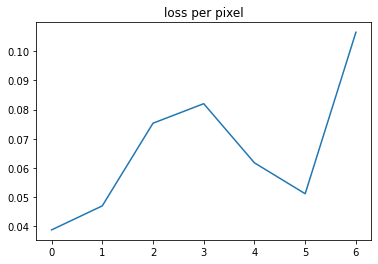

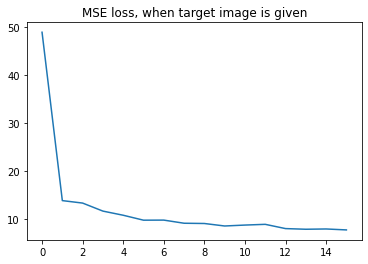

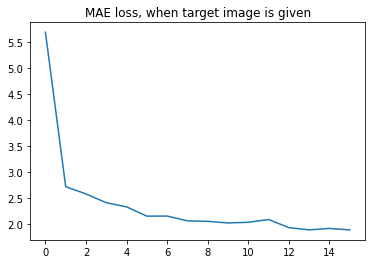

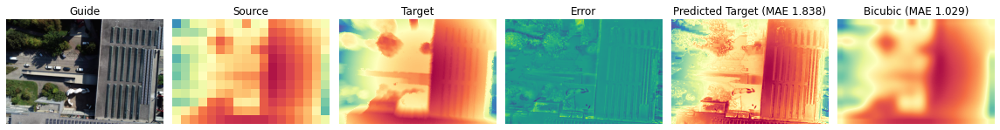

MSE: 7.504  ---  MAE: 1.838  ---  PBP: 0.532



####### image 22/25 - image idx 21 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[55.691273  14.502023  14.278877  12.447812  11.957459  10.545656
 10.826494  10.5653715 10.321542   9.903481  10.193547  10.450125
  9.776482   9.663586   9.534375   9.742772 ]
----------MAE----------
(16,)
[5.730923  2.7898128 2.616556  2.4501717 2.4323936 2.2766118 2.2515516
 2.2738602 2.2100894 2.1584013 2.234406  2.2915668 2.116907  2.1410627
 2.0974407 2.0946007]


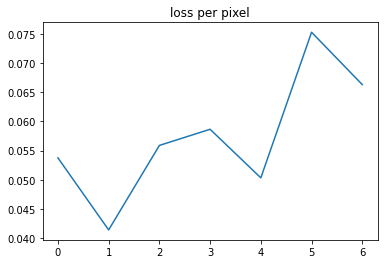

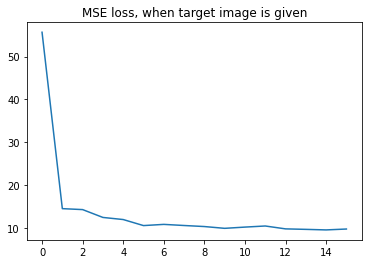

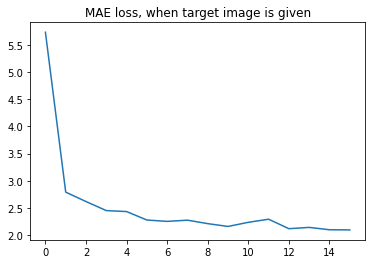

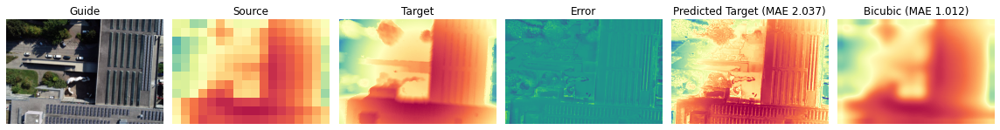

MSE: 9.123  ---  MAE: 2.037  ---  PBP: 0.570



####### image 23/25 - image idx 22 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[74.74584   12.370207  13.911578  11.031729  12.68294   11.228413
 13.2306795 13.4475    12.411784  13.001573  13.230195  14.496967
 13.476493  13.776132  14.684204  13.736137 ]
----------MAE----------
(16,)
[6.5845003 2.3600006 2.5455196 2.2457244 2.388609  2.222992  2.3888218
 2.4492445 2.3015878 2.3456438 2.3461328 2.4225152 2.343815  2.3413067
 2.4366577 2.3386621]


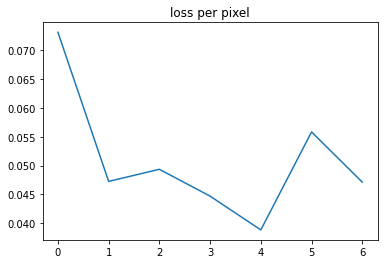

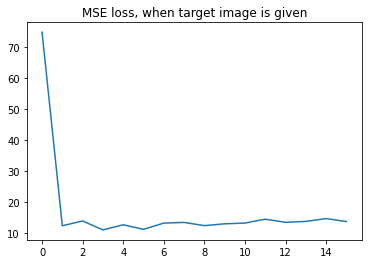

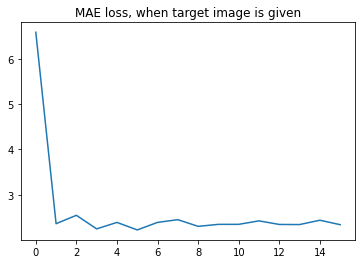

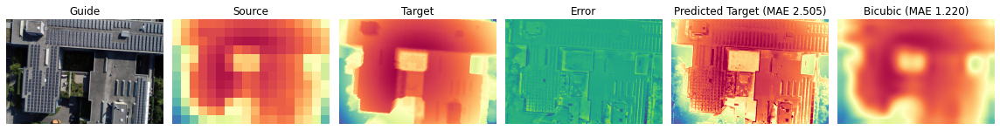

MSE: 15.657  ---  MAE: 2.505  ---  PBP: 0.595



####### image 24/25 - image idx 23 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[66.21759   17.527407  15.879793  13.575344  11.523655  12.2947855
 12.870383  10.392561  11.52458   10.261469   9.499033   9.432032
  9.582216   8.735689   8.619274   8.835555 ]
----------MAE----------
(16,)
[6.2032075 2.7697654 2.598319  2.4148738 2.2691398 2.3570044 2.4137688
 2.1573305 2.2686646 2.1791236 2.0333128 2.0374088 2.0896823 1.9746329
 1.9294066 2.0374954]


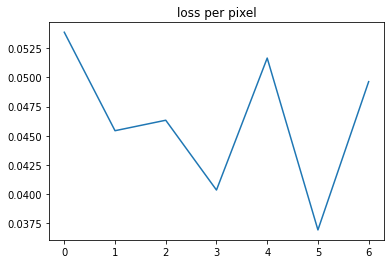

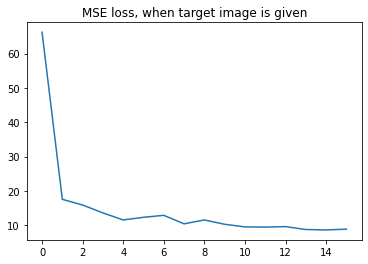

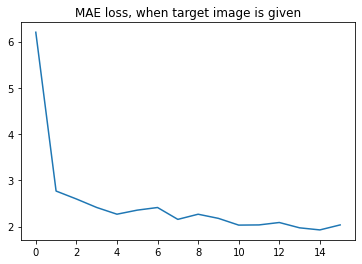

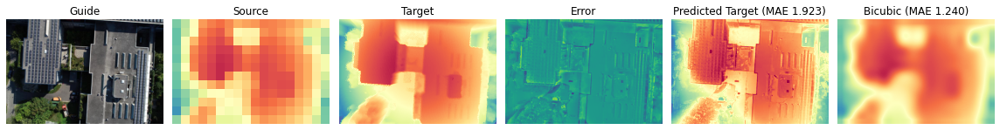

MSE: 8.370  ---  MAE: 1.923  ---  PBP: 0.543



####### image 25/25 - image idx 24 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[78.39392  15.184575 15.442254 13.58634  13.351111 13.564305 12.911279
 12.655742 12.777497 12.573432 11.445901 11.758973 11.058701 10.688297
 10.225087  9.774408]
----------MAE----------
(16,)
[6.7176027 2.5831723 2.622652  2.3631153 2.3689055 2.3344865 2.2722883
 2.2251356 2.2580884 2.1938987 2.1323576 2.16942   2.0915174 2.0754716
 2.0396178 2.0133772]


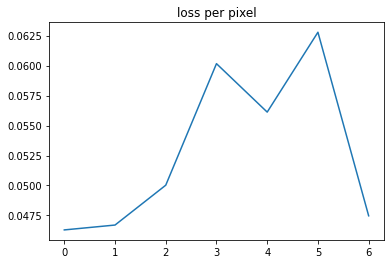

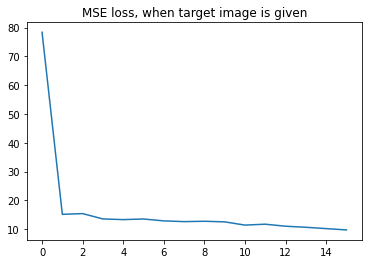

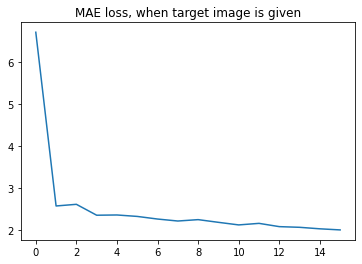

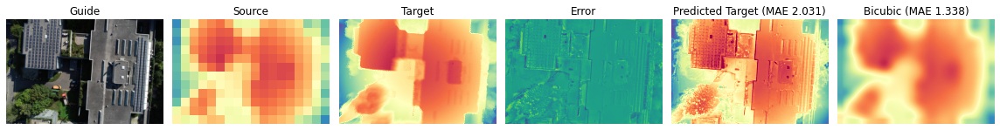

MSE: 10.313  ---  MAE: 2.031  ---  PBP: 0.538





In [9]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 40,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*12*18//32,
                  
          'logstep': 64,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }

#### train and plot the results ################################################
if len(params['img_idxs'])==0:
    idxs = np.array(range(0,target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

constant = 0
    
for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = guide_imgs[idx]
    target_img = target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_EPFL_nadir/model'+str(constant + idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 


### Change upsampling to 90， here first try crop the image to 450x720

In [10]:

torch.cuda.empty_cache()

In [11]:
guide_imgs = []
target_imgs= []

for num in range(len(_rgb_files)):
    rgb_img = imageio.imread(_rgb_files[num])
    guide_imgs.append(rgb_img)
    dist_img = torch.load(_dist_files[num])
    dist_img = dist_img.detach().cpu().numpy()
    target_imgs.append(dist_img)
        
guide_imgs = np.asarray(guide_imgs)
guide_imgs = np.einsum('ijkl->iljk', guide_imgs)        
target_imgs = np.asarray(target_imgs)

In [12]:
## crop images
new_guide_imgs = guide_imgs[:,:,15:465,:]
new_target_imgs = target_imgs[:,15:465,:]
print(new_guide_imgs.shape)
print(new_target_imgs.shape)

(25, 3, 450, 720)
(25, 450, 720)


####### image 1/25 - image idx 0 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[65.99752  23.503756 20.765474 21.678131 20.246973 19.092518 21.620052
 21.451834 20.646421 21.128515 22.040117 24.776571 23.991678 25.044361
 25.136473 24.601469]
----------MAE----------
(16,)
[6.290412  3.6788924 3.4355202 3.5614693 3.4741457 3.402095  3.5841749
 3.5563374 3.445378  3.4617617 3.5487273 3.6872957 3.653054  3.7488165
 3.7772632 3.6578536]


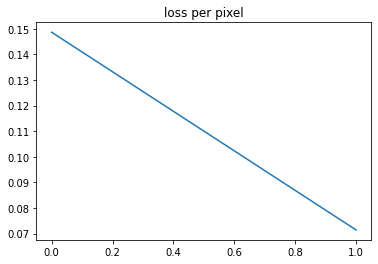

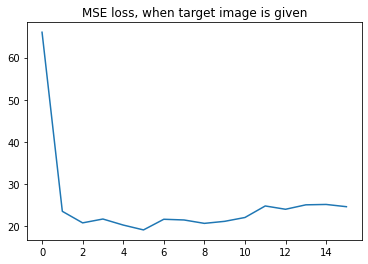

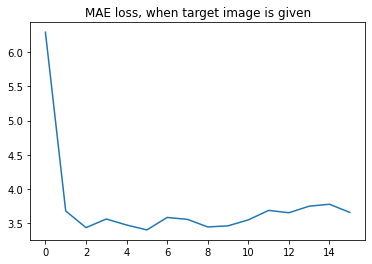

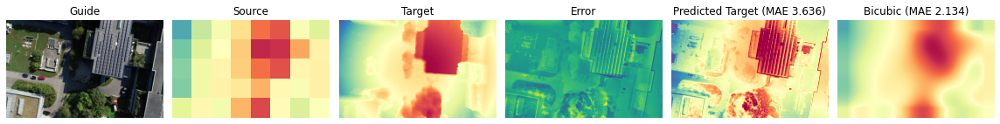

MSE: 23.884  ---  MAE: 3.636  ---  PBP: 0.812



####### image 2/25 - image idx 1 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[71.222115 28.372923 23.728033 22.413044 22.44836  22.708248 24.58958
 23.670963 22.965225 25.288977 23.51665  23.060387 22.901981 22.585386
 22.754938 22.42447 ]
----------MAE----------
(16,)
[6.666172  4.1192775 3.6199396 3.5999072 3.6437023 3.6283133 3.7594364
 3.7408419 3.6313243 3.8477747 3.6690288 3.6281888 3.6264307 3.5703142
 3.5862563 3.5881765]


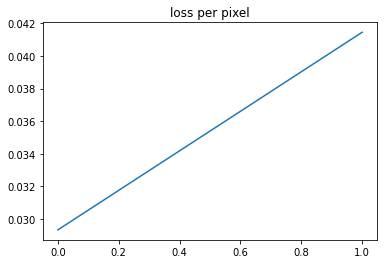

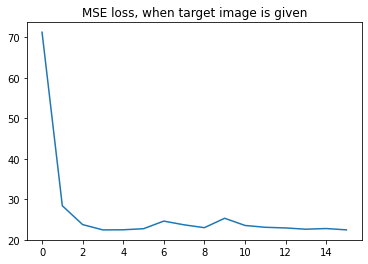

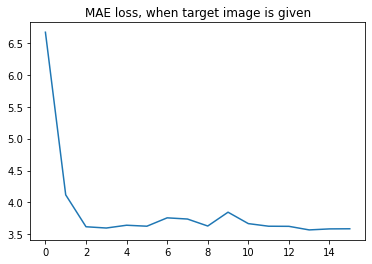

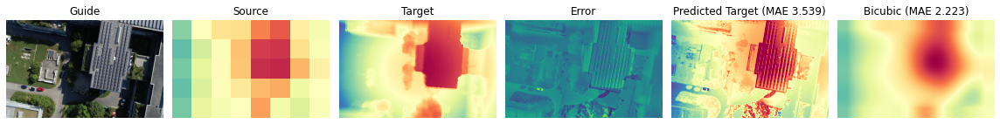

MSE: 22.060  ---  MAE: 3.539  ---  PBP: 0.811



####### image 3/25 - image idx 2 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[80.2019   23.699808 20.534395 18.159174 20.389256 18.324577 18.085405
 19.611383 18.359806 19.400833 20.182083 19.256329 19.122536 18.544239
 18.42025  18.838114]
----------MAE----------
(16,)
[7.3498197 3.851335  3.4190147 3.145733  3.3444908 3.1392844 3.2373261
 3.3459103 3.1944788 3.3098416 3.463521  3.3215148 3.3065603 3.2557585
 3.3225973 3.309705 ]


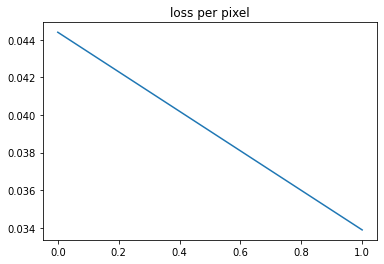

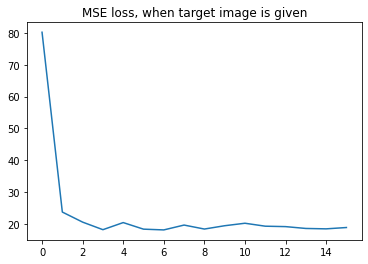

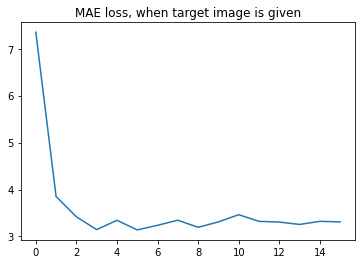

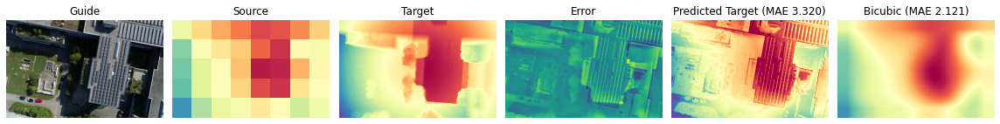

MSE: 19.084  ---  MAE: 3.320  ---  PBP: 0.785



####### image 4/25 - image idx 3 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[85.32552  30.248255 29.431358 22.964022 21.453342 22.052849 21.726381
 22.771847 21.247347 25.224371 23.958982 23.421547 24.267977 24.175352
 24.342453 26.060383]
----------MAE----------
(16,)
[7.907223  4.1509633 4.2209363 3.6299307 3.4622257 3.5201151 3.4592423
 3.4747076 3.3705955 3.7131119 3.523375  3.4221675 3.4353397 3.4141212
 3.4509678 3.665833 ]


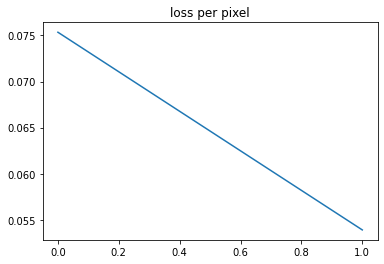

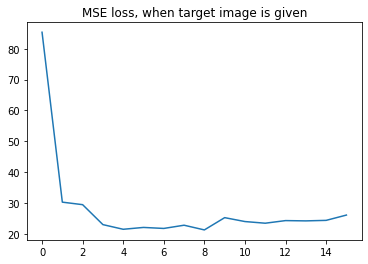

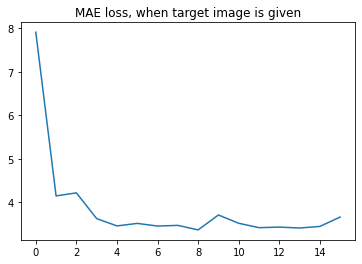

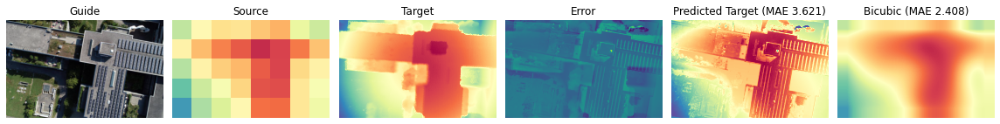

MSE: 25.793  ---  MAE: 3.621  ---  PBP: 0.811



####### image 5/25 - image idx 4 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[85.45935  35.1977   44.09326  37.242767 35.565178 32.215412 35.098946
 34.089497 31.964779 32.367958 32.199947 32.77235  32.548077 32.144444
 31.419636 31.486174]
----------MAE----------
(16,)
[7.8995094 4.55223   5.157683  4.7249427 4.6107826 4.336786  4.612295
 4.480107  4.2929444 4.325122  4.3526087 4.3389463 4.335955  4.2950215
 4.2706203 4.2454734]


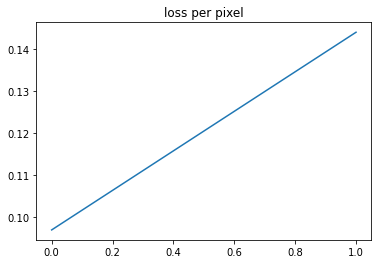

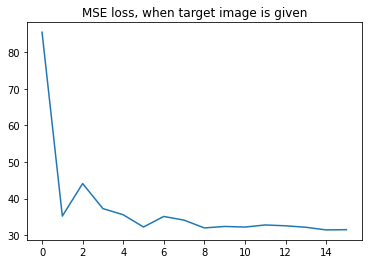

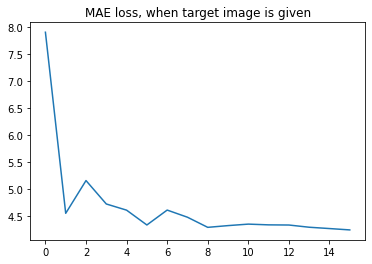

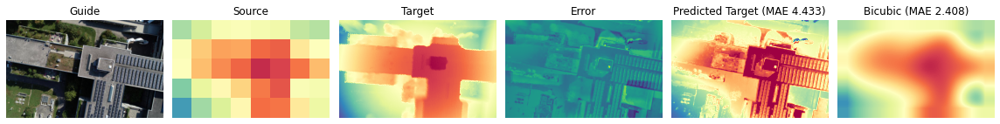

MSE: 34.301  ---  MAE: 4.433  ---  PBP: 0.829



####### image 6/25 - image idx 5 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[74.982376 34.500084 28.656712 27.467136 26.01589  25.765827 24.30896
 24.017448 23.29249  23.03095  23.172642 23.52826  23.553288 24.160774
 27.37729  26.154156]
----------MAE----------
(16,)
[7.1772156 4.3829346 4.003305  3.9635193 3.7872512 3.8168411 3.6764038
 3.5765378 3.552005  3.4921992 3.4980295 3.5848446 3.5012512 3.479313
 3.798565  3.5986576]


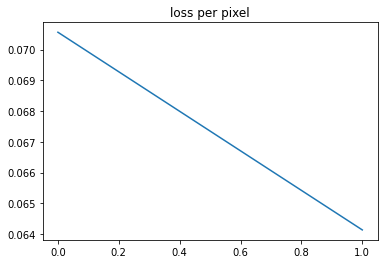

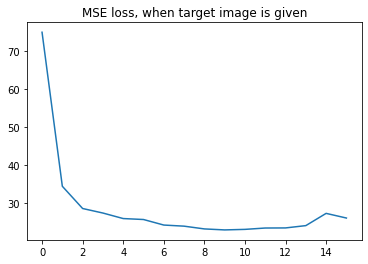

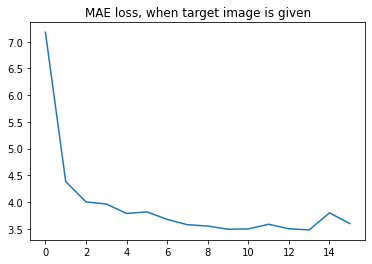

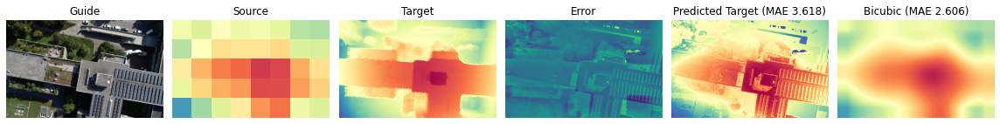

MSE: 25.308  ---  MAE: 3.618  ---  PBP: 0.789



####### image 7/25 - image idx 6 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[70.308945 41.102463 34.984093 37.84539  37.312565 40.050472 39.336746
 38.993004 41.11586  41.529415 42.278435 40.95615  44.398846 44.1159
 45.59671  43.521393]
----------MAE----------
(16,)
[6.825193  4.859989  4.5985374 4.7421975 4.67971   4.7926917 4.7345366
 4.6910357 4.735134  4.8756914 4.846095  4.7592287 5.0075917 4.9307895
 5.0400314 4.916068 ]


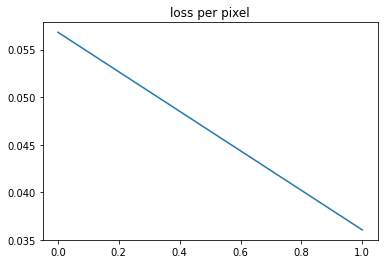

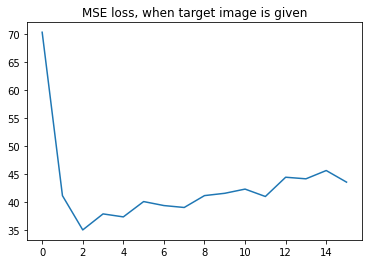

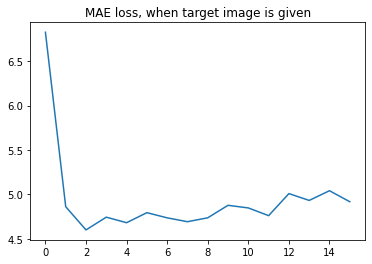

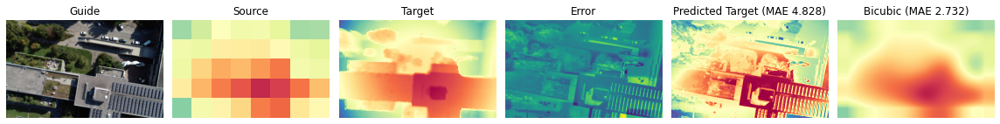

MSE: 42.466  ---  MAE: 4.828  ---  PBP: 0.849



####### image 8/25 - image idx 7 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[40.429436 18.08708  17.239109 16.137539 16.89467  16.749514 17.180912
 18.181284 17.849794 18.223804 18.059984 18.76289  19.049553 19.119406
 19.517178 19.226492]
----------MAE----------
(16,)
[5.0748954 3.3347585 3.2284997 3.1231675 3.2475116 3.2486236 3.2853765
 3.3781667 3.3511028 3.364571  3.3611774 3.4240594 3.4299607 3.4304476
 3.4780285 3.451489 ]


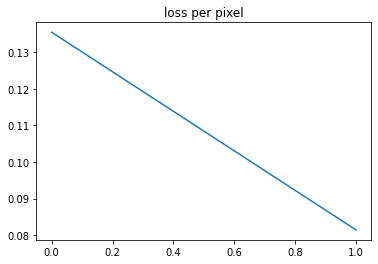

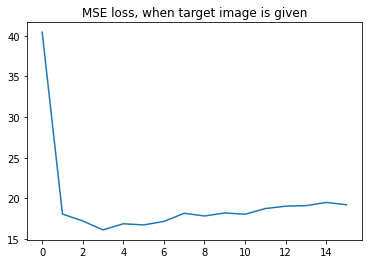

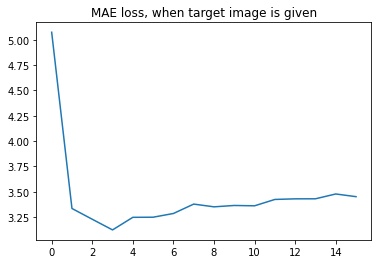

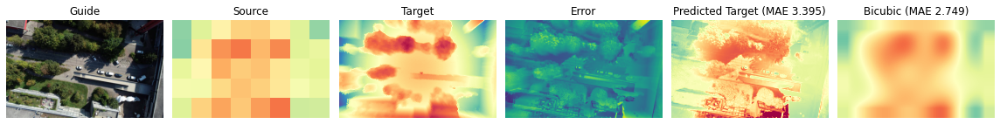

MSE: 18.555  ---  MAE: 3.395  ---  PBP: 0.814



####### image 9/25 - image idx 8 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[72.5172   31.350594 27.701273 28.890926 26.628273 25.010653 22.183142
 22.598568 21.97132  21.850615 20.337818 20.8148   19.430136 20.591454
 19.351154 20.285444]
----------MAE----------
(16,)
[6.9907928 4.444443  3.88878   4.0302463 3.8674319 3.7348166 3.487728
 3.6037428 3.5441942 3.5235689 3.3711555 3.460206  3.328043  3.3742876
 3.301186  3.3558   ]


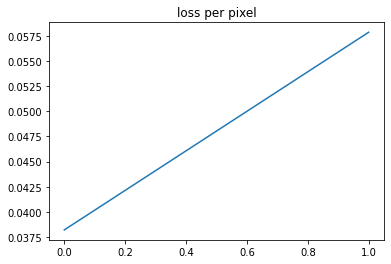

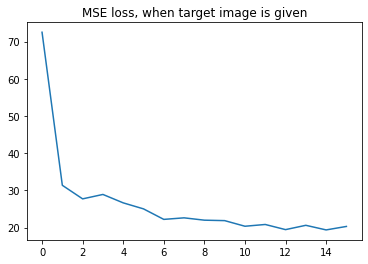

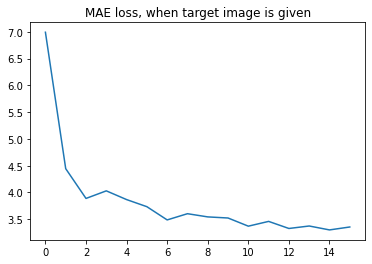

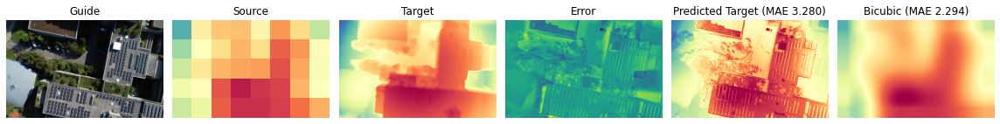

MSE: 19.386  ---  MAE: 3.280  ---  PBP: 0.744



####### image 10/25 - image idx 9 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[64.26997  43.706657 25.938766 25.08145  22.132616 23.75923  24.763334
 25.101883 25.87067  23.670233 25.92318  23.603287 23.88452  25.204618
 25.436821 25.233608]
----------MAE----------
(16,)
[6.504551  4.993105  3.9053729 3.7263513 3.432527  3.5312011 3.5168917
 3.5209641 3.5654368 3.4298933 3.5683358 3.3941877 3.4307778 3.547987
 3.575297  3.5198476]


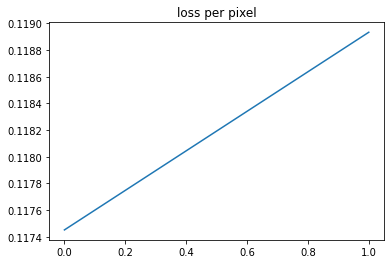

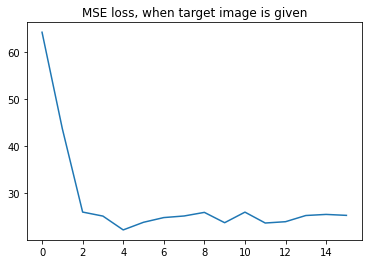

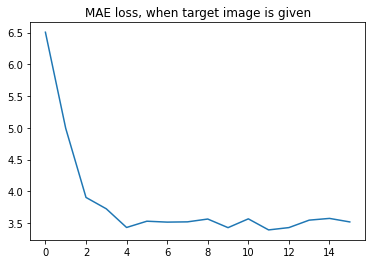

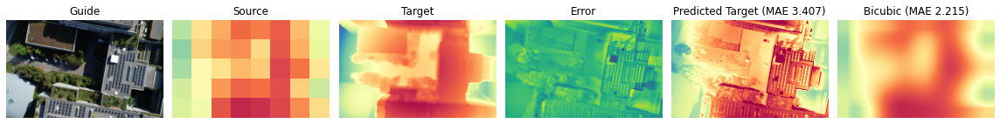

MSE: 23.912  ---  MAE: 3.407  ---  PBP: 0.752



####### image 11/25 - image idx 10 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[82.851875 34.63053  27.108334 23.536686 21.626099 21.422325 20.101646
 21.534346 20.427391 19.263191 20.181107 18.877003 19.209057 19.224155
 17.747948 19.40908 ]
----------MAE----------
(16,)
[7.166193  4.57569   4.006105  3.740237  3.5518208 3.4994059 3.3953354
 3.4954982 3.3623917 3.2472184 3.3435957 3.172062  3.209669  3.202628
 3.082903  3.2502682]


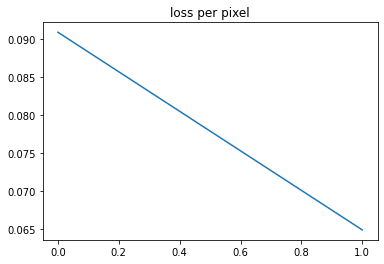

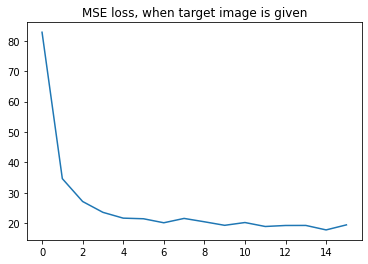

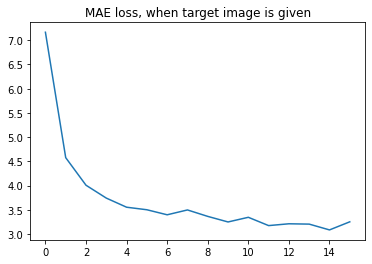

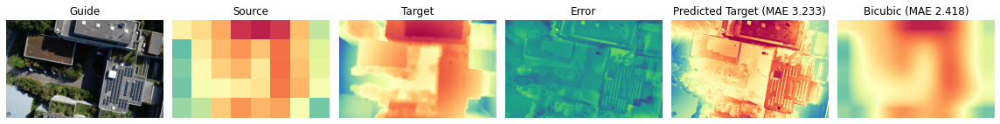

MSE: 19.155  ---  MAE: 3.233  ---  PBP: 0.760



####### image 12/25 - image idx 11 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[60.6272   38.717342 33.84865  30.92834  29.249983 26.020275 31.620264
 28.413538 28.594479 27.523216 27.14271  24.736055 26.679256 26.674963
 23.646957 24.831846]
----------MAE----------
(16,)
[6.384914  4.585438  4.2439857 4.038423  3.8904128 3.6593933 4.0329137
 3.7782724 3.77979   3.6464956 3.6510317 3.4646914 3.6401043 3.6165178
 3.3878396 3.5061042]


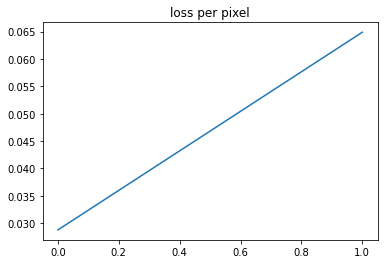

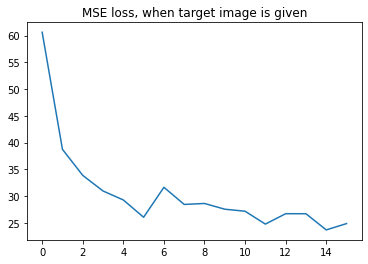

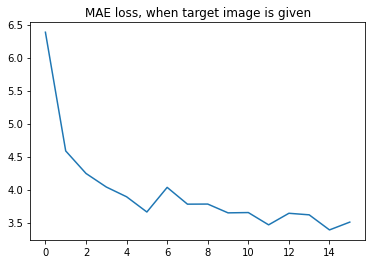

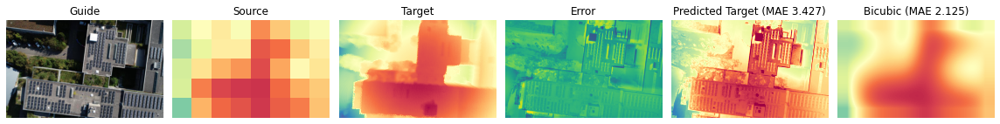

MSE: 24.093  ---  MAE: 3.427  ---  PBP: 0.757



####### image 13/25 - image idx 12 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[67.536995 35.30056  30.93084  22.957117 22.202639 22.87103  25.021215
 26.220291 27.030247 27.059025 27.658457 26.308725 27.479359 26.984371
 27.890806 27.852161]
----------MAE----------
(16,)
[6.7149663 4.4708705 4.1632843 3.426583  3.3821583 3.4687061 3.6449294
 3.6913817 3.8009377 3.802294  3.809411  3.7219446 3.8046937 3.7899
 3.8563416 3.8393972]


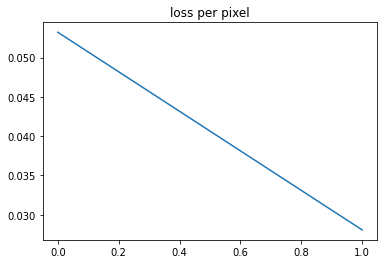

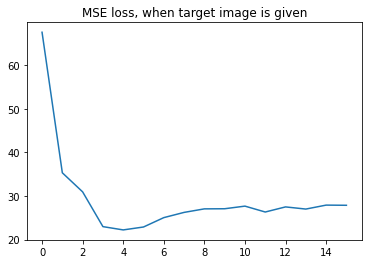

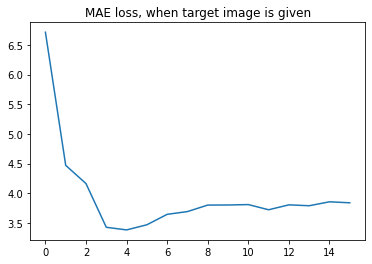

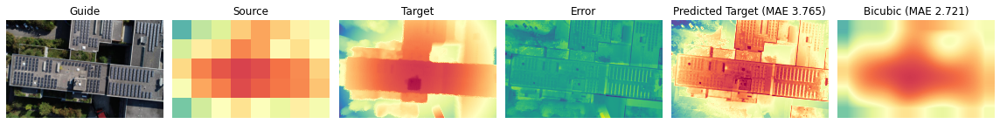

MSE: 27.028  ---  MAE: 3.765  ---  PBP: 0.800



####### image 14/25 - image idx 13 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[70.30991  43.526157 37.863823 33.113945 36.53218  33.473537 35.807728
 35.267433 34.407475 37.285736 37.913364 38.550747 36.664864 38.383904
 35.72706  37.434967]
----------MAE----------
(16,)
[6.6821485 5.156981  4.6613946 4.272542  4.477423  4.1958966 4.344209
 4.345733  4.195031  4.384532  4.4580536 4.523687  4.35068   4.450829
 4.297939  4.36347  ]


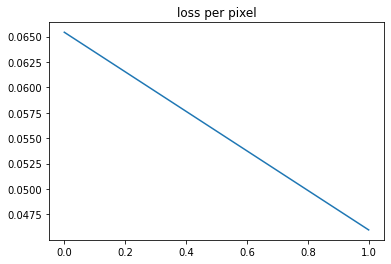

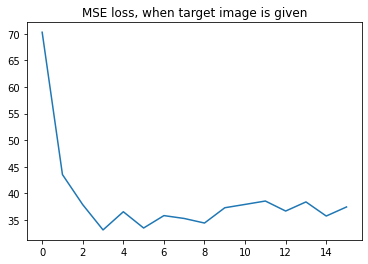

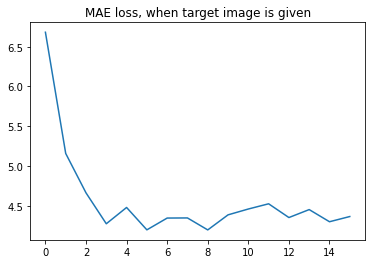

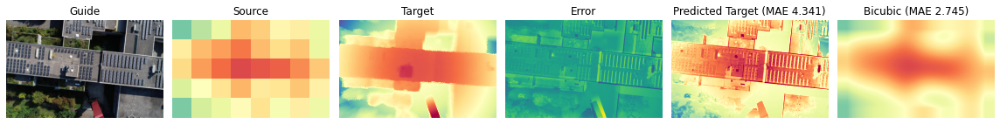

MSE: 36.458  ---  MAE: 4.341  ---  PBP: 0.818



####### image 15/25 - image idx 14 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[60.13091  19.897083 17.83097  19.866726 19.103474 20.351765 22.506035
 23.907053 24.641796 26.139654 24.54477  28.240063 26.712772 26.119097
 28.010084 27.542723]
----------MAE----------
(16,)
[5.9554615 3.103995  2.8597085 3.0395353 2.9076068 2.9733472 3.1181176
 3.2555594 3.241954  3.3742433 3.2293437 3.464092  3.3369722 3.2648864
 3.4087214 3.3762774]


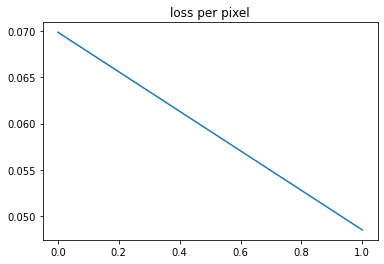

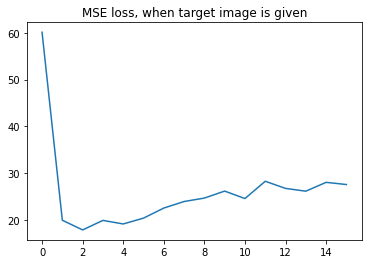

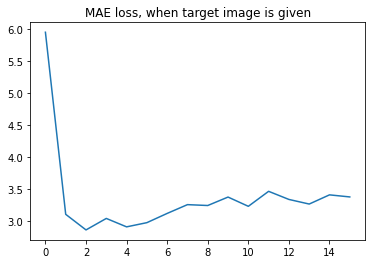

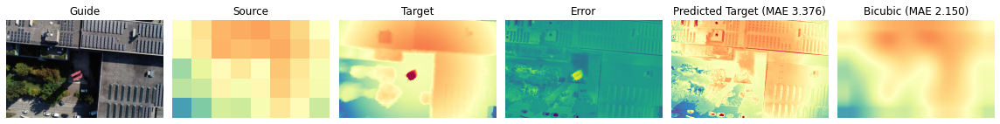

MSE: 27.165  ---  MAE: 3.376  ---  PBP: 0.715



####### image 16/25 - image idx 15 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[65.6653   23.930273 21.207718 18.196733 17.458748 18.006699 17.51751
 18.53135  19.209787 19.136484 20.51262  20.71951  20.17682  20.70051
 19.618752 20.815226]
----------MAE----------
(16,)
[6.064023  3.6173825 3.2188659 2.8831336 2.854646  2.9122713 2.8711543
 2.9780595 3.055701  2.9844365 3.1723638 3.240438  3.1051867 3.1528614
 3.0981014 3.1759233]


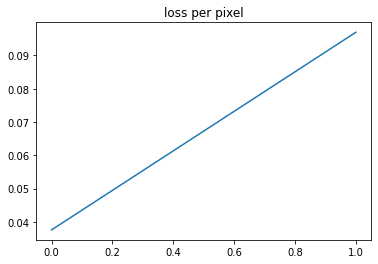

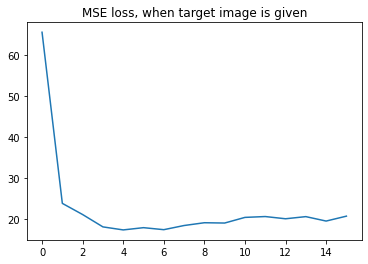

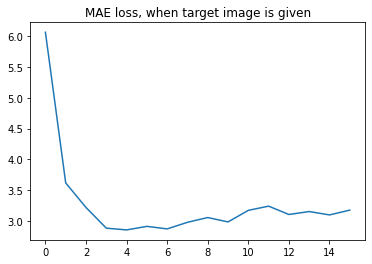

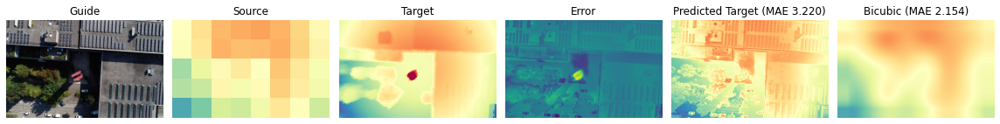

MSE: 21.518  ---  MAE: 3.220  ---  PBP: 0.748



####### image 17/25 - image idx 16 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[60.013756 20.701914 19.681396 19.632269 21.61138  23.593767 23.112682
 23.770273 24.481335 24.821815 24.971554 25.131056 24.89813  26.755432
 24.851559 25.259325]
----------MAE----------
(16,)
[6.0364175 3.3976715 3.1469705 3.1321278 3.2574902 3.362147  3.3054087
 3.348322  3.4402158 3.3948288 3.361988  3.3807192 3.3050885 3.4138532
 3.3274915 3.310862 ]


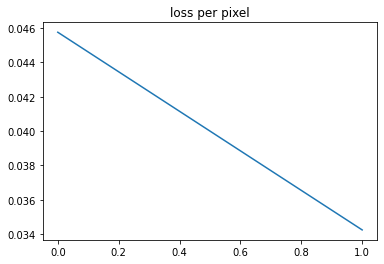

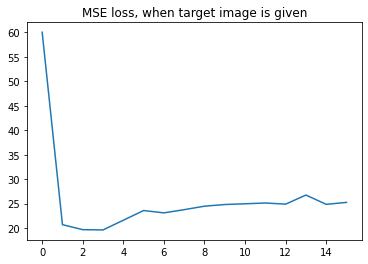

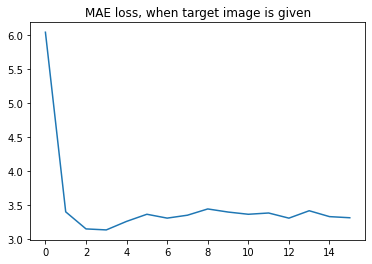

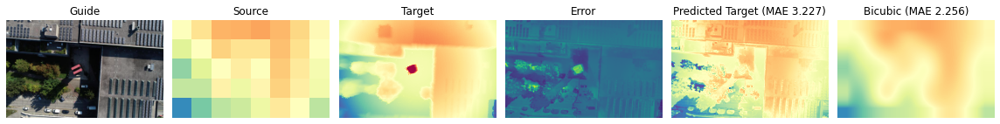

MSE: 24.090  ---  MAE: 3.227  ---  PBP: 0.725



####### image 18/25 - image idx 17 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[55.73031  20.986515 20.899305 20.826185 19.486393 19.938122 18.505955
 18.698288 18.991371 18.354708 18.535686 18.554348 19.4831   19.580969
 20.471207 20.169893]
----------MAE----------
(16,)
[5.8354483 3.3284338 3.5285294 3.532257  3.38363   3.3878713 3.2974417
 3.2930229 3.3711336 3.1975944 3.2520545 3.2362628 3.33836   3.322903
 3.4267392 3.3409693]


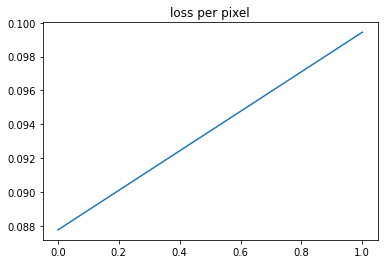

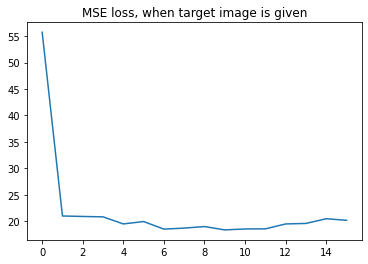

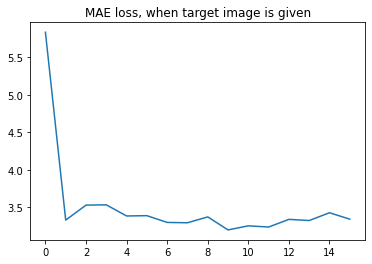

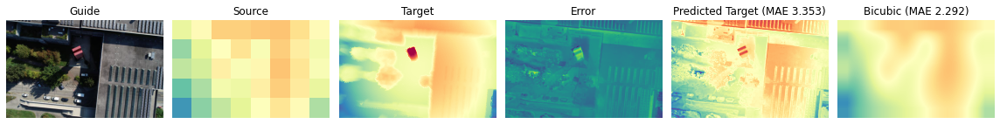

MSE: 20.241  ---  MAE: 3.353  ---  PBP: 0.796



####### image 19/25 - image idx 18 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[52.828564 31.81946  22.332834 24.07818  23.487726 21.78796  21.706741
 23.212162 23.41767  23.316244 23.266985 25.37024  23.628902 23.206198
 23.626427 24.126614]
----------MAE----------
(16,)
[5.7232447 4.0549836 3.4328985 3.6426814 3.6869307 3.5139205 3.5347216
 3.692666  3.7445488 3.6608477 3.70293   3.8930833 3.7088096 3.6559353
 3.741258  3.7617896]


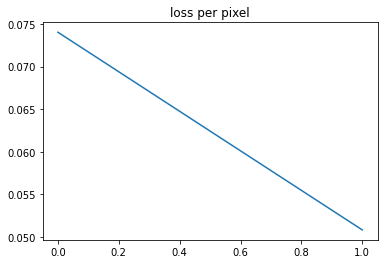

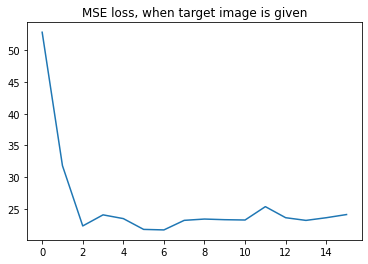

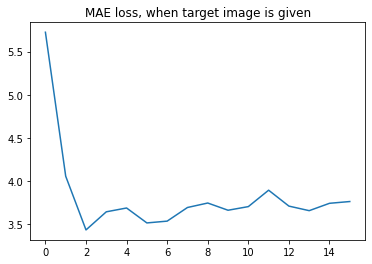

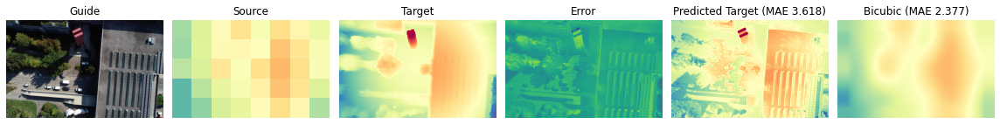

MSE: 22.982  ---  MAE: 3.618  ---  PBP: 0.809



####### image 20/25 - image idx 19 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[52.82508  32.75035  30.16329  30.504198 31.052124 32.69543  33.385963
 31.134563 35.3382   30.154167 33.894302 29.411442 32.117218 30.008158
 31.598906 29.946901]
----------MAE----------
(16,)
[5.7332935 4.465097  4.3597836 4.1949706 4.298937  4.578765  4.516437
 4.3554077 4.6470823 4.1964273 4.533122  4.0443377 4.2909293 4.1257286
 4.261487  4.092507 ]


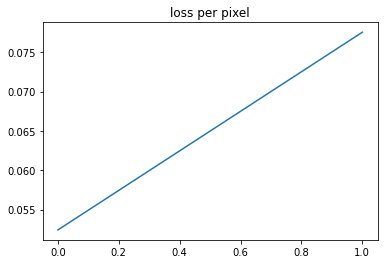

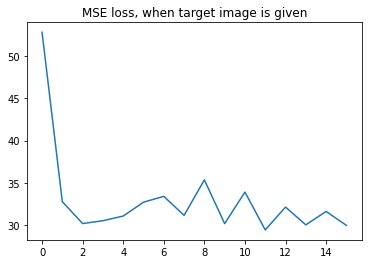

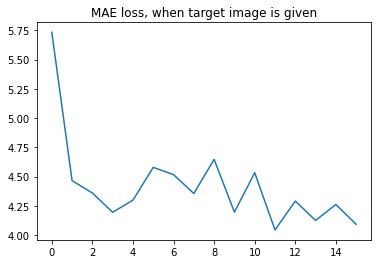

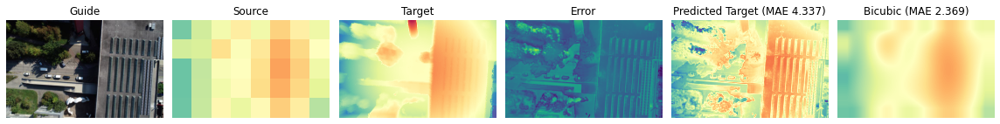

MSE: 31.874  ---  MAE: 4.337  ---  PBP: 0.855



####### image 21/25 - image idx 20 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[53.22263  33.58436  26.886007 26.266285 27.824802 25.244028 25.469164
 23.514355 24.034729 22.622969 24.675308 24.25725  22.728271 23.200314
 23.207514 23.092028]
----------MAE----------
(16,)
[5.914622  4.2724156 3.9684708 3.971653  4.006509  3.974748  3.8504827
 3.7260756 3.7640378 3.7653139 3.8522563 3.8592205 3.6985927 3.7746131
 3.7424371 3.7040951]


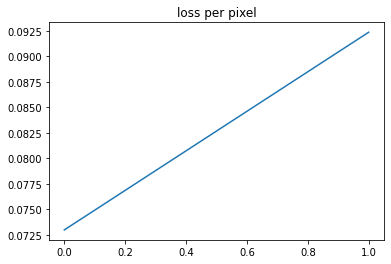

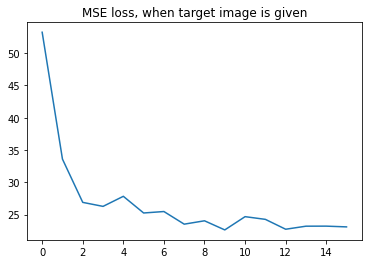

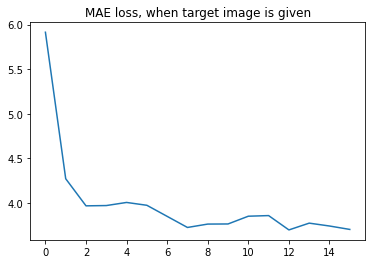

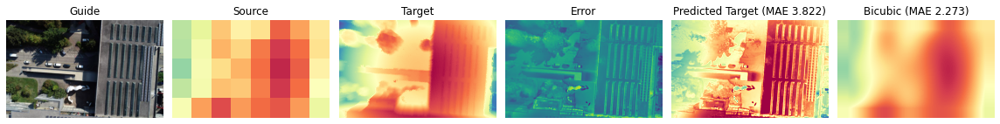

MSE: 23.717  ---  MAE: 3.822  ---  PBP: 0.851



####### image 22/25 - image idx 21 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[59.89236  22.755987 26.357216 28.824726 27.895086 30.379154 28.610254
 29.578165 29.770714 29.641356 30.224327 31.614964 29.0099   30.432476
 30.50287  29.140123]
----------MAE----------
(16,)
[6.2174625 3.6529813 3.9486194 4.254653  4.1540256 4.413579  4.23566
 4.250197  4.2999687 4.277534  4.2668614 4.494343  4.2226095 4.3714933
 4.396661  4.261519 ]


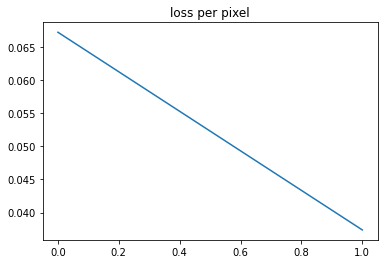

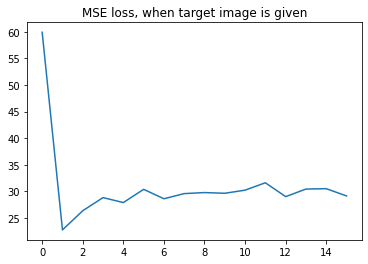

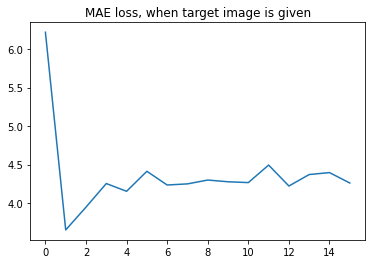

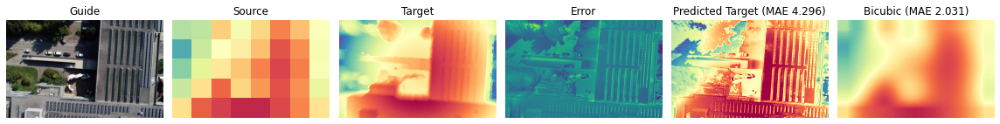

MSE: 29.205  ---  MAE: 4.296  ---  PBP: 0.873



####### image 23/25 - image idx 22 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[79.23199  32.46509  26.17244  22.416939 21.513916 21.003069 21.061829
 23.068748 22.020306 20.687365 20.564707 20.428541 21.763506 20.881056
 21.118853 20.1873  ]
----------MAE----------
(16,)
[6.1633673 4.0233316 3.5058532 3.2787635 3.259978  3.2314472 3.2169514
 3.488514  3.2515988 3.1813698 3.1254022 3.111716  3.2013226 3.122916
 3.1301625 3.067221 ]


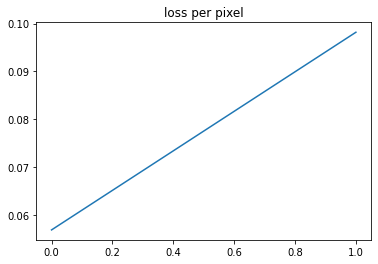

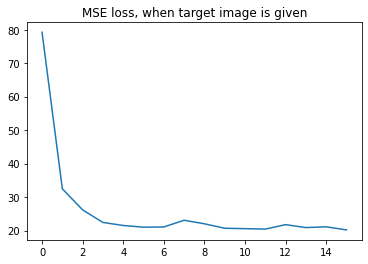

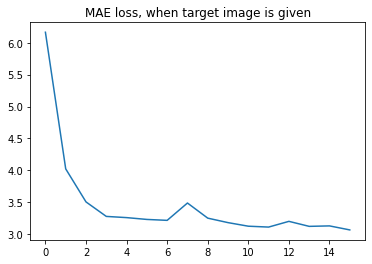

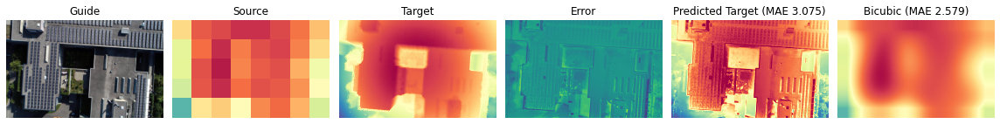

MSE: 20.396  ---  MAE: 3.075  ---  PBP: 0.708



####### image 24/25 - image idx 23 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[62.50078  27.633392 20.476622 19.210155 20.41848  19.349476 20.040546
 21.720066 21.326118 22.991852 22.946306 22.180765 23.31224  23.328648
 23.227291 24.82294 ]
----------MAE----------
(16,)
[6.234105  3.8638859 3.1915178 3.1637986 3.2738867 3.1129544 3.096291
 3.2548797 3.2292995 3.2541053 3.3262308 3.2366786 3.3141057 3.3016078
 3.3111956 3.3737192]


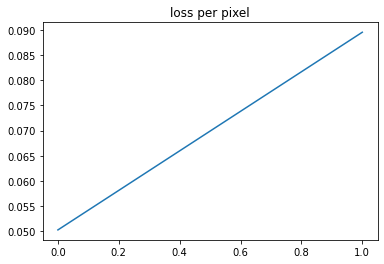

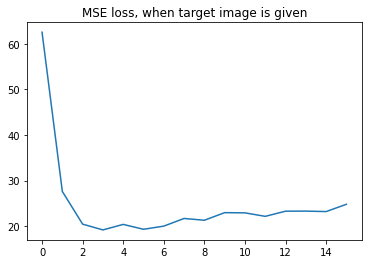

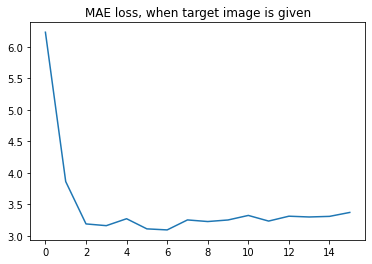

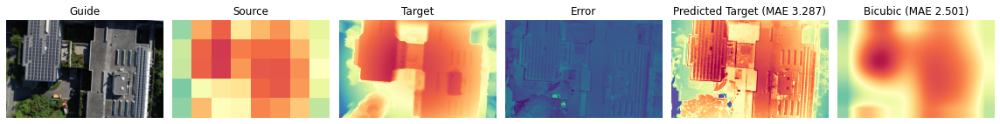

MSE: 23.429  ---  MAE: 3.287  ---  PBP: 0.733



####### image 25/25 - image idx 24 ########


  0%|          | 0/1024 [00:00<?, ?it/s]

----------MSE----------
(16,)
[63.60052  38.05503  28.61074  36.647823 36.698353 49.21906  56.726025
 59.63005  59.54452  57.444485 58.948673 59.362457 59.196686 60.03895
 57.246334 58.099247]
----------MAE----------
(16,)
[6.242555  4.2024584 3.707564  4.5654116 4.2895613 4.710032  4.932784
 5.1656713 5.1413054 5.1597605 5.120609  5.1226373 5.0480227 5.179359
 4.9413395 5.068582 ]


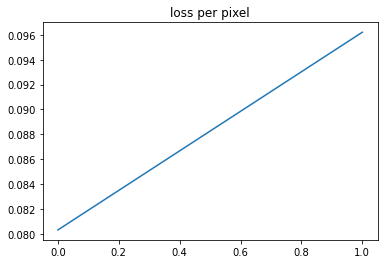

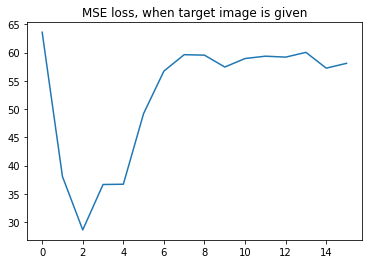

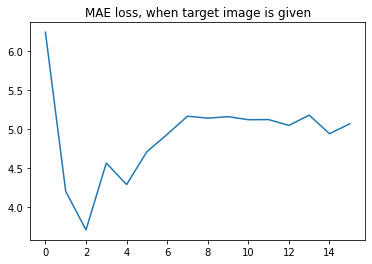

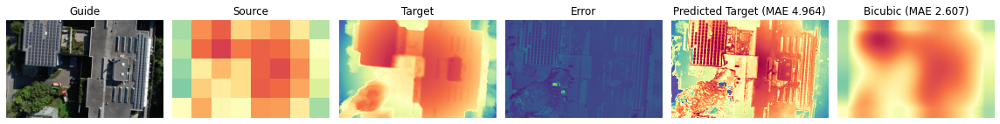

MSE: 55.252  ---  MAE: 4.964  ---  PBP: 0.824





In [13]:
####  define parameters  ########################################################
params = {'img_idxs' : [], # idx images to process, if empty then all of them
            
          'scaling': 90,
          'greyscale': False, # Turn image into grey-scale
          'channels': -1,
          
          'spatial_features_input': True,
          'weights_regularizer': [0.0001, 0.001, 0.0001], # spatial color head
          'loss': 'l1',
 
          'optim': 'adam',
          'lr': 0.001,
                  
          'batch_size': 32,
          'iteration': 1024*5*8//32,
                  
          'logstep': 64,
          
          'final_TGV' : False, # Total Generalized Variation in post-processing
          'align': False, # Move image around for evaluation in case guide image and target image are not perfectly aligned
          'delta_PBP': 1, # Delta for percentage of bad pixels 
         }

if len(params['img_idxs'])==0:
    idxs = np.array(range(0,new_target_imgs.shape[0]))
else:
    idxs = params['img_idxs']

constant = 50
    
for n_image,idx in enumerate(idxs):
    
    print("####### image {}/{} - image idx {} ########".format(n_image+1,len(idxs),idx))
    
    guide_img = new_guide_imgs[idx]
    target_img = new_target_imgs[idx]
    source_img = downsample(target_img,params['scaling'])
    save_path = directory+'/saved_model_EPFL_nadir/model'+str(constant + idx)+'.pt'
    # check if the directory exist
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    
    bicubic_target_img = bicubic(source_img=source_img, scaling_factor=params['scaling'])
    
    predicted_target_img = PixTransform(guide_img=guide_img,source_img=source_img,params=params,target_img=target_img, path = save_path)
    


    if params['final_TGV'] :
        print("applying TGV...")
        predicted_target_img = tvgen(predicted_target_img,[0.1, 0.1],[1, 2],[1, 1])
        
    if params['align'] :
        print("aligning...")
        target_img,predicted_target_img = align_images(target_img,predicted_target_img)

    f, ax = plot_result(guide_img,source_img,predicted_target_img,bicubic_target_img,target_img)
    plt.show()
    
    if target_img is not None:
        # compute metrics and plot results
        MSE = np.mean((predicted_target_img - target_img) ** 2)
        MAE = np.mean(np.abs(predicted_target_img - target_img))
        PBP = np.mean(np.abs(predicted_target_img - target_img) > params["delta_PBP"])

        print("MSE: {:.3f}  ---  MAE: {:.3f}  ---  PBP: {:.3f}".format(MSE,MAE,PBP))
        print("\n\n")
 